In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os, scipy
import matplotlib.colors as mcolors
import networkx as nx
import pickle

if os.getcwd().split(os.sep)[-1] == "examples":
    os.chdir('..')
    os.chdir('..')
    os.chdir('..')
    os.chdir('..')

# We import the model, stimuli, and the optimal control package
from neurolib.models.wc import WCModel
from neurolib.utils.stimulus import ZeroInput
from neurolib.optimal_control import oc_wc, cost_functions
from neurolib.optimal_control.oc_utils.plot_oc import plot_oc_nw

# This will reload all imports as soon as the code changes
%load_ext autoreload
%autoreload 2

options = {
    'node_color': 'lightgray',
    'node_size': 1000,
    'width': 2,
    'arrowstyle': '-|>',
    'arrowsize': 20,
    'font_size' : 20,
    'font_weight' : 'bold',
    }

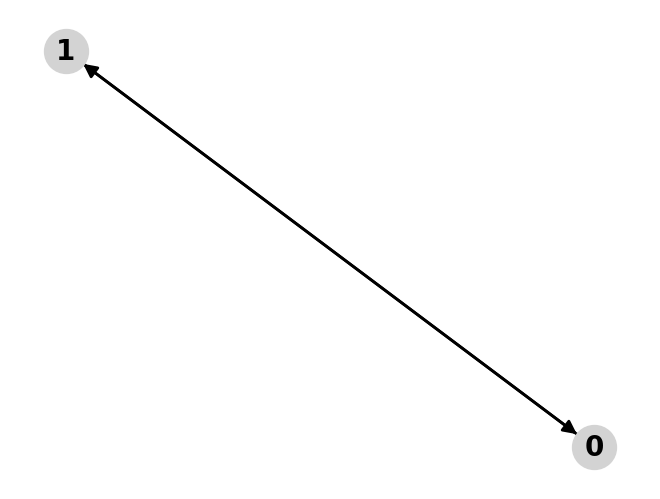

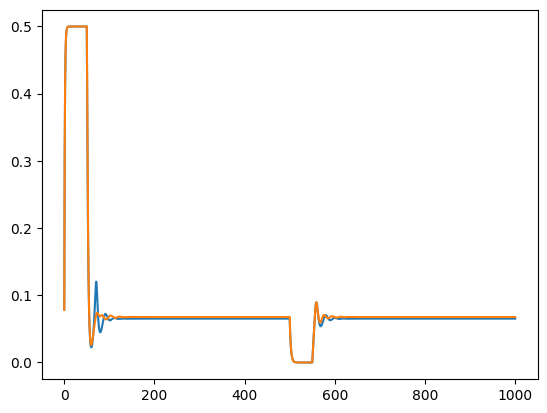

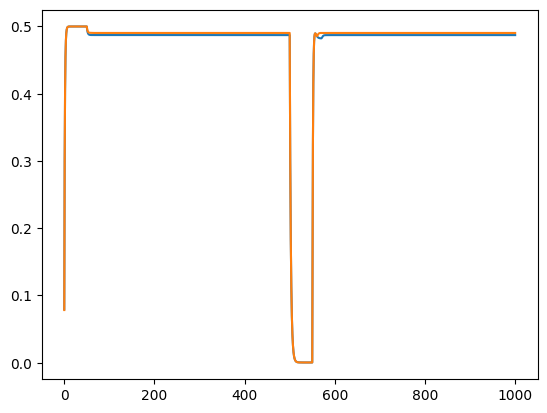

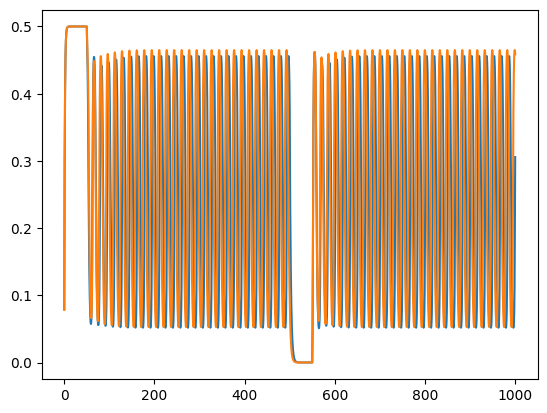

period =  16.60588235294118
difference osc peaks =  4.2


In [14]:
comp_points = [[1., 0.5], [3., 0.5], [2., 0.5]]

cmat = np.array( [[0., 0.5], [1., 0.]] ) # diagonal elements are zero, connection strength is 1 from node 0 to node 1
dmat = np.array( [[0., 20.], [10., 0.]] ) # delay from 0 to 1

N = cmat.shape[0]

G = nx.DiGraph() 
for n in range(cmat.shape[0]):
        for l in range(cmat.shape[1]):
            if cmat[n,l] != 0:
                G.add_edge(l,n)
nx.draw(G, with_labels=True, arrows=True, **options)
plt.savefig(os.path.join(dir, "network.png"), bbox_inches='tight')
plt.show()

colors = []
n = 0
for col in mcolors.TABLEAU_COLORS:
    colors.append(col)
    n += 1
    if n >= N: break

model = WCModel(Cmat=cmat, Dmat=dmat)

dt = 0.1
model.params['dt'] = dt # Integration time step, ms
model.params['duration'] = 1. * 1000 # Simulation time, ms
model.params.signalV = 1.

zero_input = ZeroInput().generate_input(duration=model.params['duration']+model.params.dt, dt=model.params.dt)
rect_input = np.vstack( (zero_input)*2 )
rect_input[0,:500] = 5.
rect_input[0,5000:5500] = -5.

for p in comp_points:
    model.params["exc_ext"] = p[0] + rect_input[0,:]
    model.params["inh_ext"] = p[1]
    model.run()

    for n in range(N):
        plt.plot(model.t, model.exc[n,:], color=colors[n])
    plt.show()

    if p[0] == 2.:

        peaks = scipy.signal.find_peaks(model.exc[0,2000:5000])[0]
        plist = []
        for pind in range(1, len(peaks)):
            plist.append(model.params.dt * (peaks[pind]-peaks[pind-1]))

        period = np.mean(plist)
        print("period = ", period)

        peaks0 = scipy.signal.find_peaks(model.exc[0,4000:5000])[0]
        peaks1 = scipy.signal.find_peaks(model.exc[1,4000:5000])[0]

        nat_diff = (peaks0[1] - peaks1[1]) * dt

        print("difference osc peaks = ", nat_diff)


In [5]:
def getperiods(x, prominence):
    timing_list = [None] * N
    periods_list = [None] * N

    for n in range(N):
        timing_list[n] = scipy.signal.find_peaks(x[n, 0, 300:], prominence=prominence)[0]
        periods_list[n] = []
        if len(timing_list[n]) < 3:
            continue
        for pind in range(1, len(timing_list[n])):
            periods_list[n].append(model.params.dt * (timing_list[n][pind]-timing_list[n][pind-1]))

    return timing_list, periods_list

In [6]:
controlmat = np.zeros((N,2))
controlmat[:,0] = 1.

costmat = np.zeros((N, 2))
costmat[:,0] = 1.

duration = 200.
model.params.duration = duration
zero_input0 = ZeroInput().generate_input(duration=duration+model.params.dt, dt=model.params.dt)
zero_input = np.vstack( ([zero_input0]*2) )[np.newaxis,:,:]
zero_control = np.vstack( ([zero_input]*N))

print(zero_input0.shape, zero_input.shape, zero_control.shape)

w2_array = [1e-3, 1e-5]

results = dict()
results["controls"] = [ [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
]

target_array = [0.5*period, 0.9*period, period, 1.1*period, 1.6*period]
results["periods"] = [ [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
]
results["timings"] = [ [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
]

(1, 2001) (1, 2, 2001) (2, 2, 2001)


In [7]:
it = 100
pr = np.arange(0,101,10)
maxstr = 10.
nmaxdel = model.getMaxDelay()

proms = [0.01, 0.001]

init_control = zero_control.copy()
dir = "images_2n"

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.3263661495659229
Converged in iteration 5 with cost -0.3500769782845898
Final cost : -0.3500769782845898


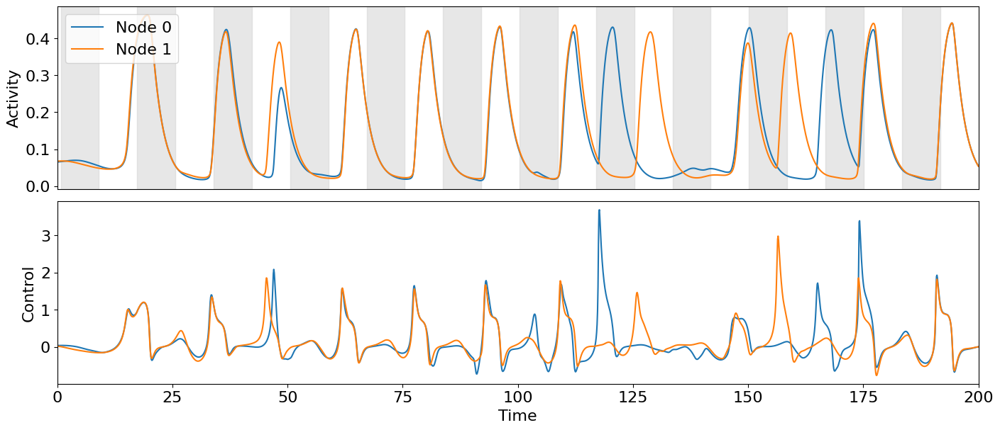

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.7861157280125315
Cost in iteration 10: -0.7982431641758732
Converged in iteration 13 with cost -0.8047941304798956
Final cost : -0.8047941304798956


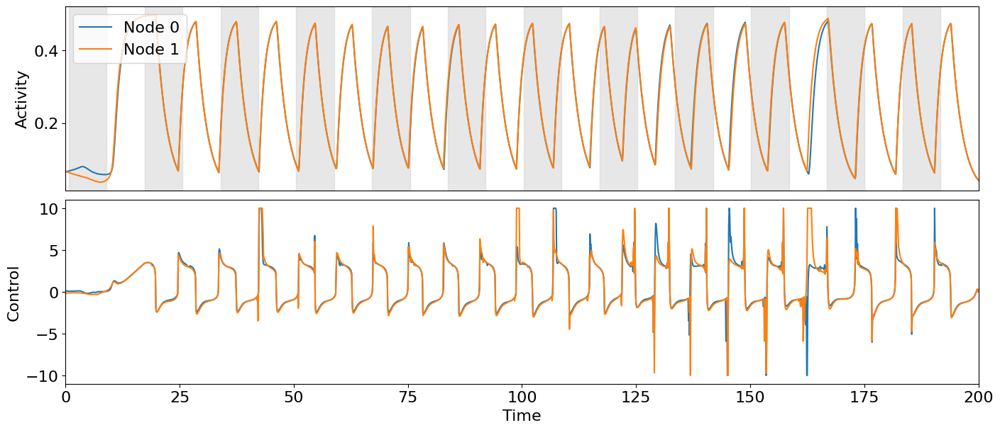

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.939708245509034e-29
Converged in iteration 2 with cost -6.11947299563166e-29
Final cost : -6.11947299563166e-29


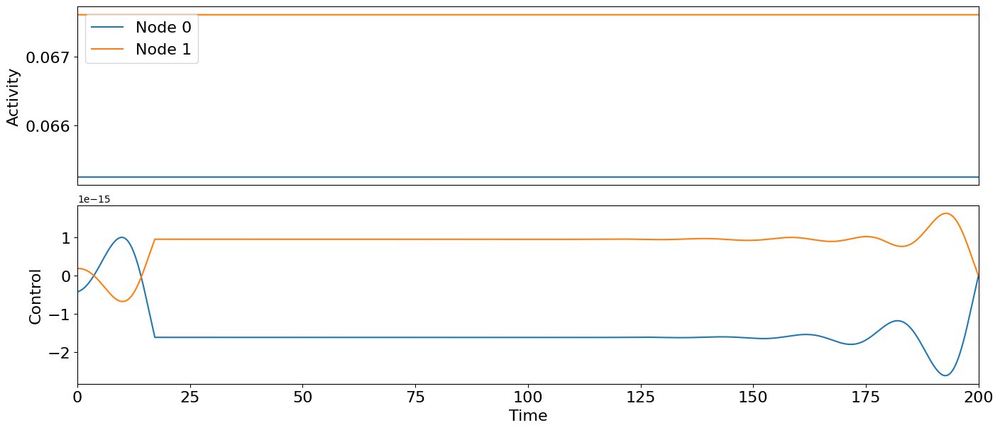

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.961692338912553e-29
Converged in iteration 2 with cost -6.156955743366046e-29
Final cost : -6.156955743366046e-29


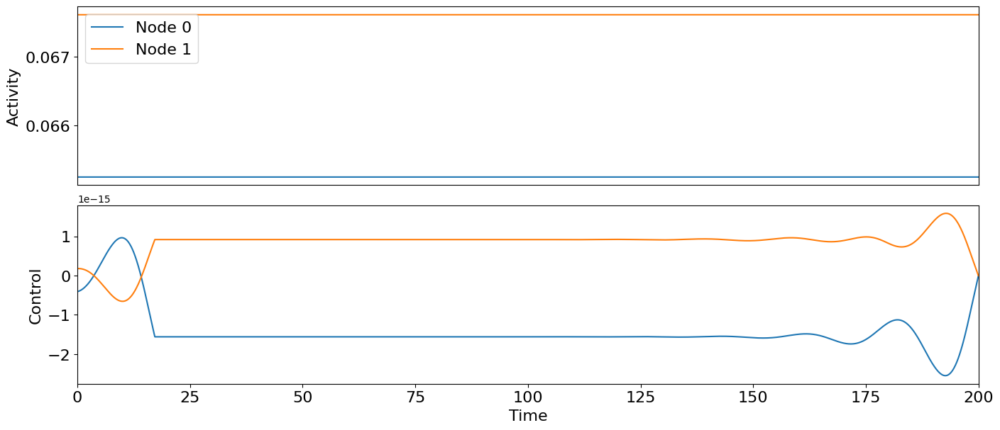

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -461.9037390837233
Converged in iteration 3 with cost -464.00350816602577
Final cost : -464.00350816602577


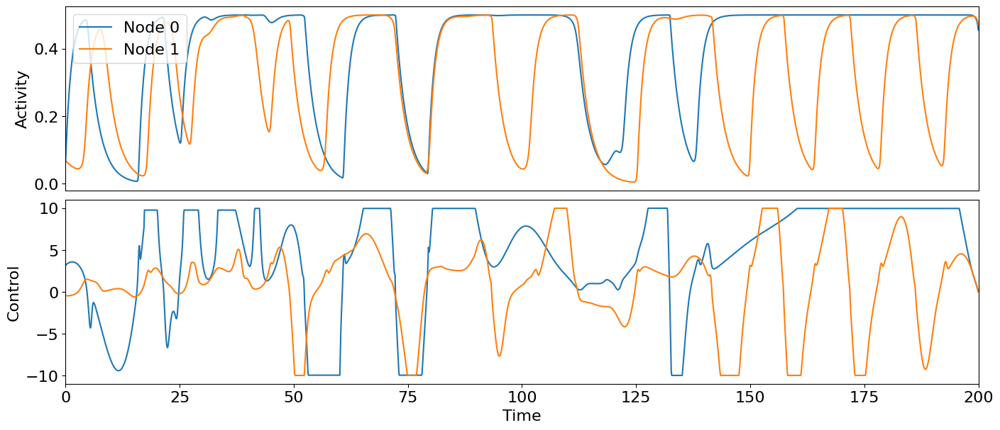

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -469.74015061065563
Converged in iteration 3 with cost -471.6715817176983
Final cost : -471.6715817176983


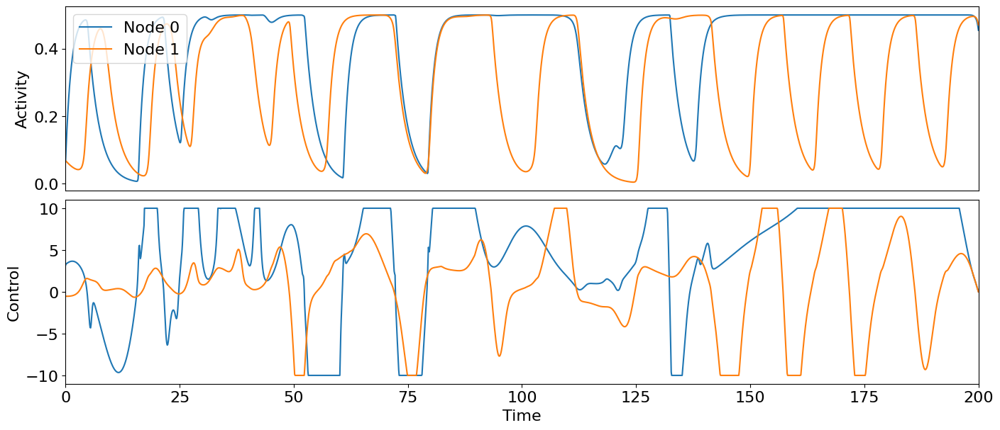

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 1.6502826712149837e-05
Converged in iteration 3 with cost 1.645976430830139e-05
Final cost : 1.645976430830139e-05


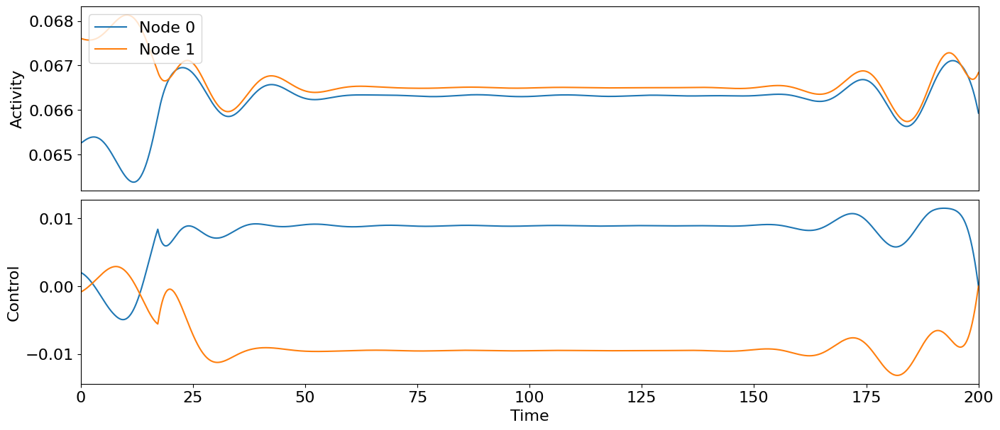

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 5.264574519859085e-07
Converged in iteration 2 with cost 4.2290438572823523e-07
Final cost : 4.2290438572823523e-07


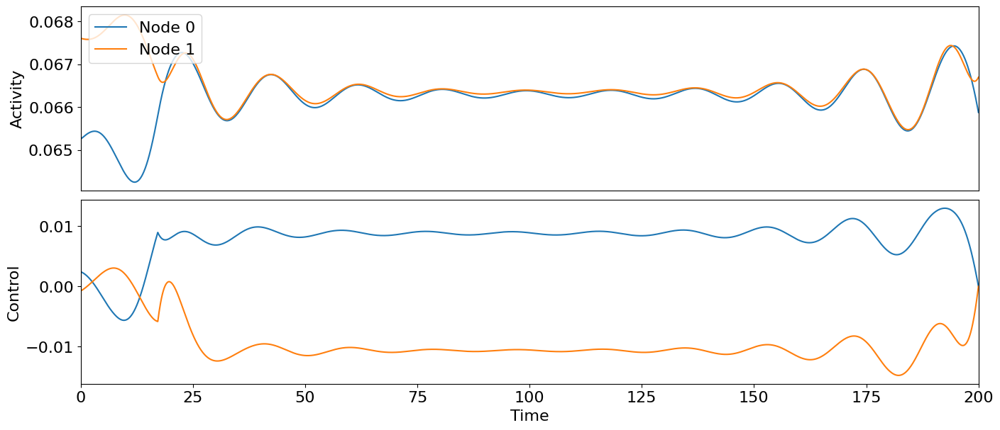

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.6499970872188962
Converged in iteration 8 with cost -0.6579650205144763
Final cost : -0.6579650205144763


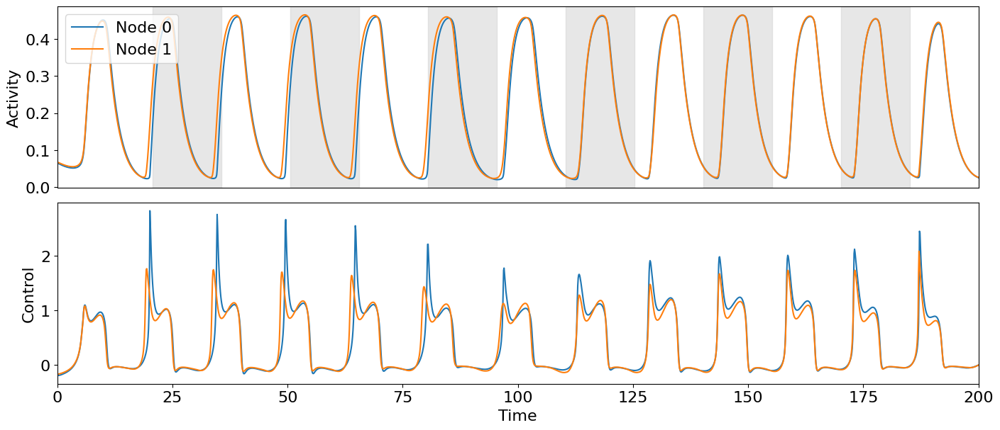

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8348418067826502
Cost in iteration 10: -0.8348641366972018
Converged in iteration 15 with cost -0.8348941543663166
Final cost : -0.8348941543663166


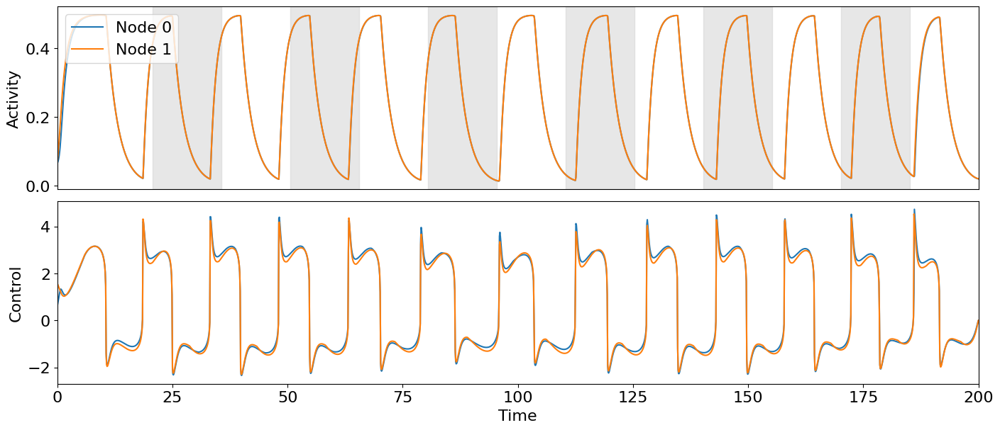

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -6.515185703018118e-29
Converged in iteration 2 with cost -6.708255679651315e-29
Final cost : -6.708255679651315e-29


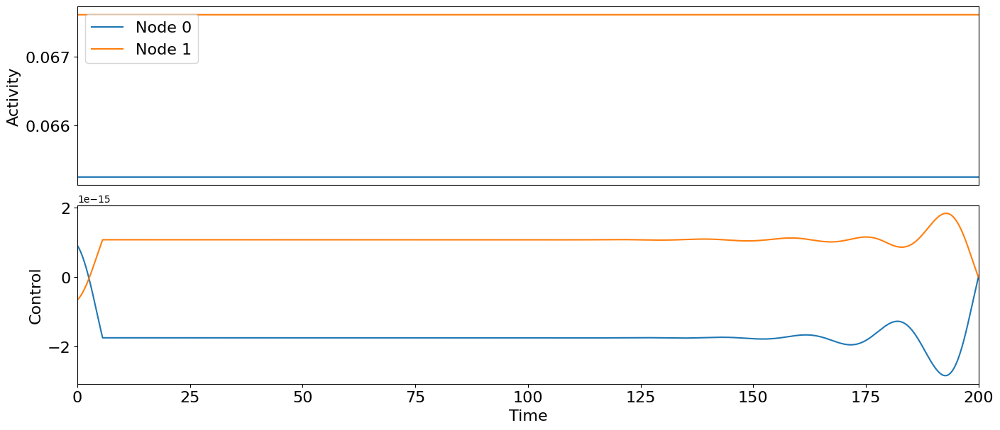

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -6.542515662641262e-29
Converged in iteration 3 with cost -7.856387437224859e-29
Final cost : -7.856387437224859e-29


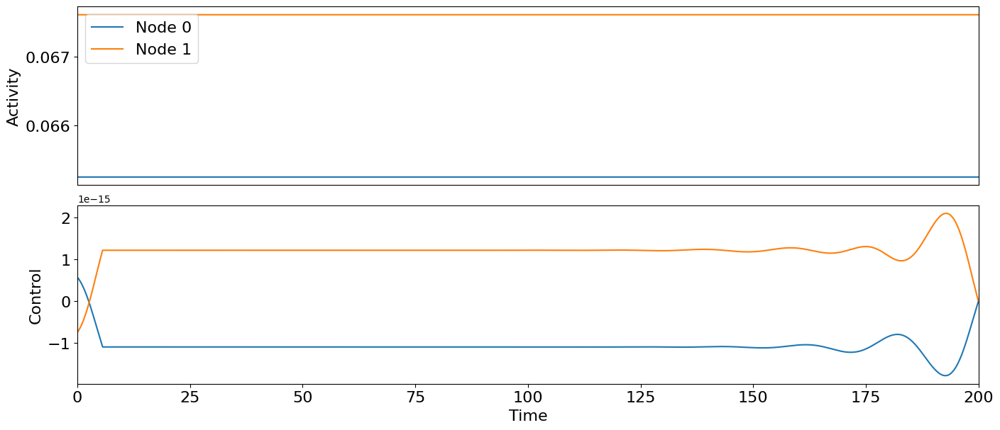

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -716.6633565270034
Cost in iteration 10: -716.663776033256
Converged in iteration 14 with cost -716.663776033256
Final cost : -716.663776033256


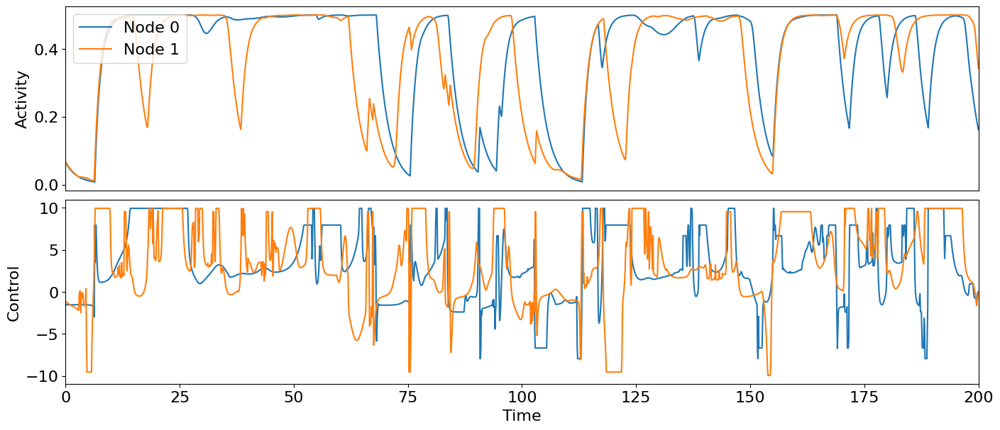

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -560.2533035564927
Converged in iteration 2 with cost -561.1813872102085
Final cost : -561.1813872102085


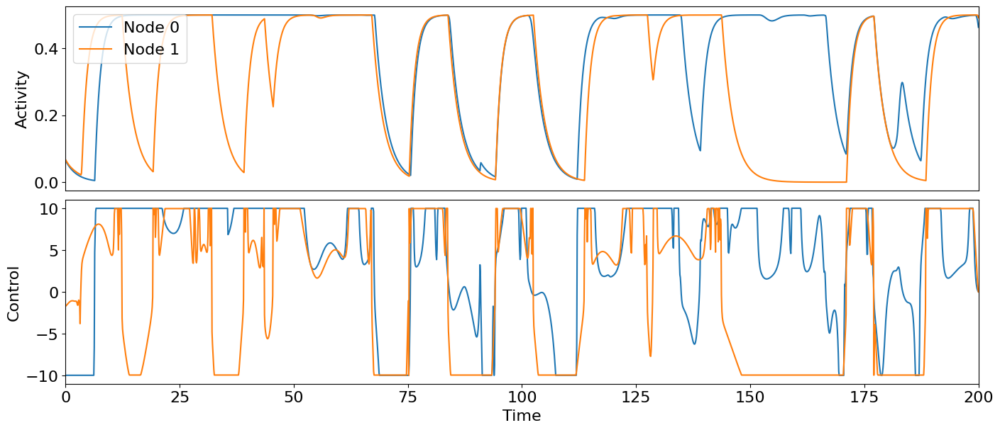

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 1.7627076404530413e-05
Converged in iteration 3 with cost 1.754981714084958e-05
Final cost : 1.754981714084958e-05


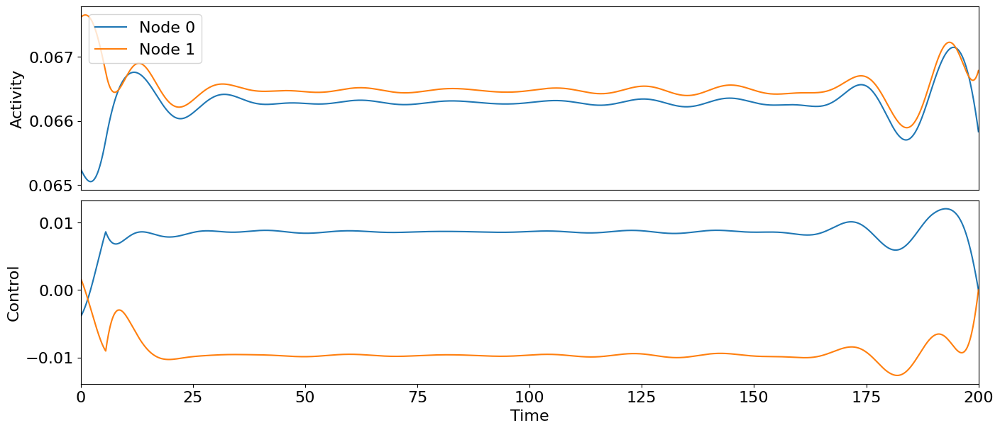

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 3.073184136830554e-07
Converged in iteration 2 with cost 2.913488324348451e-07
Final cost : 2.913488324348451e-07


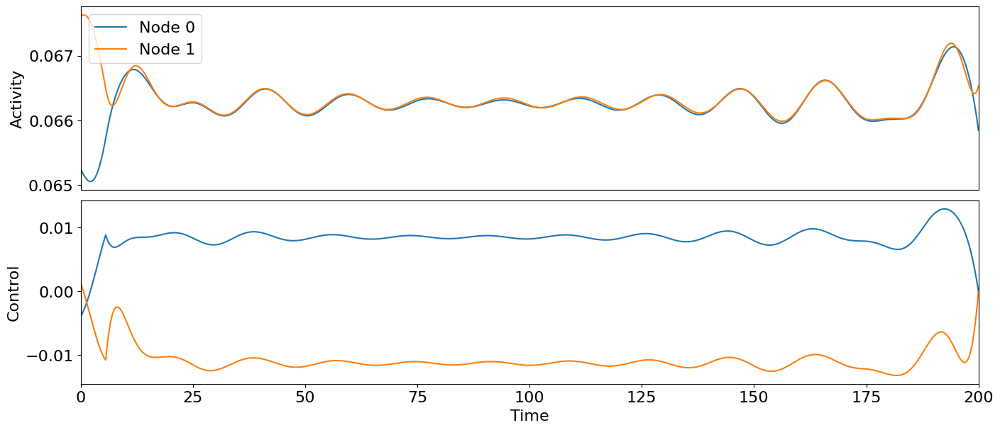

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.6909935030539678
Converged in iteration 7 with cost -0.6960705728364567
Final cost : -0.6960705728364567


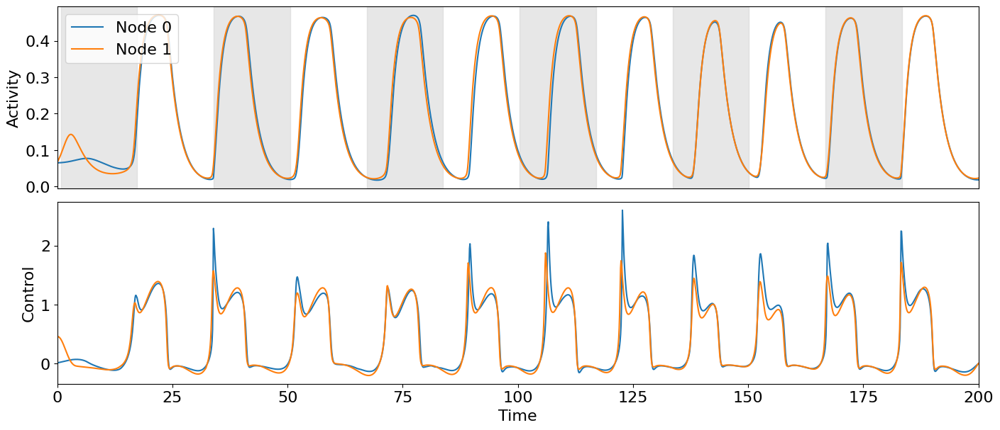

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8658372424944651
Cost in iteration 10: -0.8659337875911629
Converged in iteration 14 with cost -0.866129804087611
Final cost : -0.866129804087611


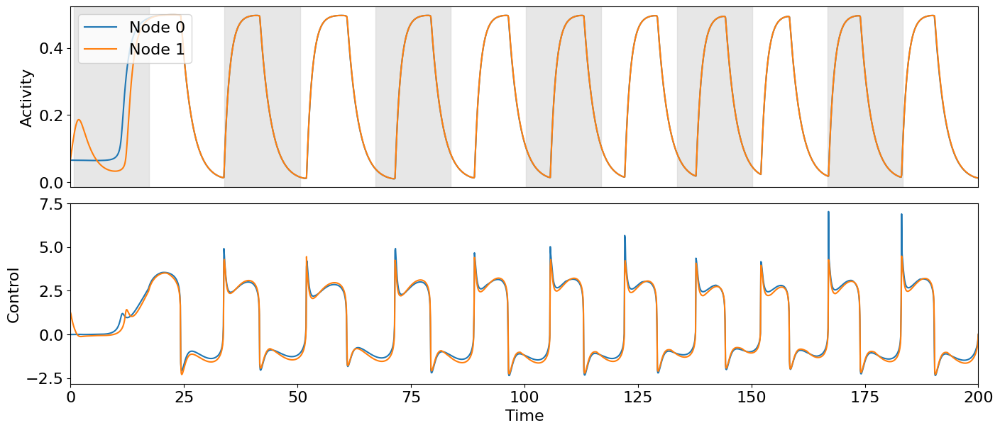

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.939708245509034e-29
Converged in iteration 2 with cost -6.11947299563166e-29
Final cost : -6.11947299563166e-29


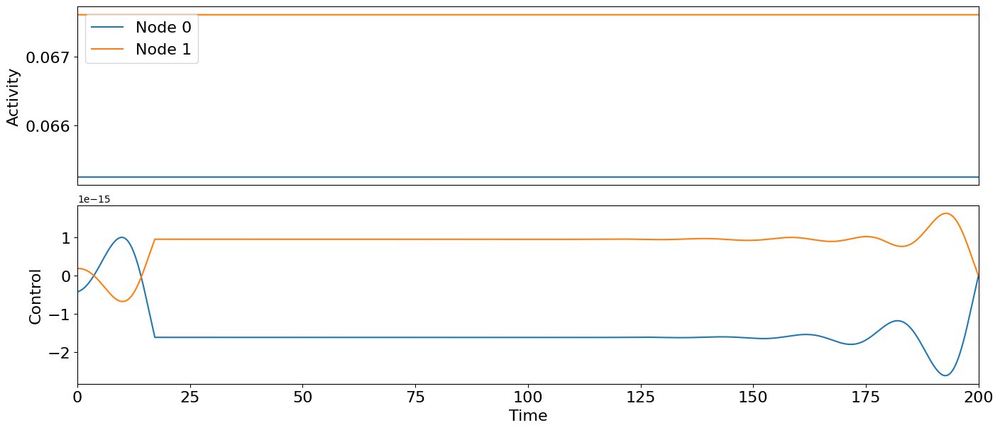

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.961692338912553e-29
Converged in iteration 2 with cost -6.156955743366046e-29
Final cost : -6.156955743366046e-29


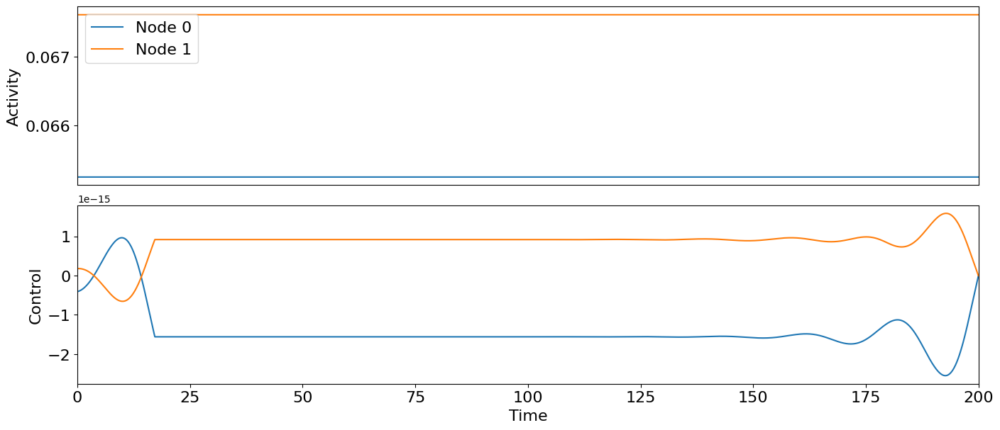

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -625.2014709278502
Cost in iteration 10: -625.2197120966179
Converged in iteration 15 with cost -625.2197120966423
Final cost : -625.2197120966423


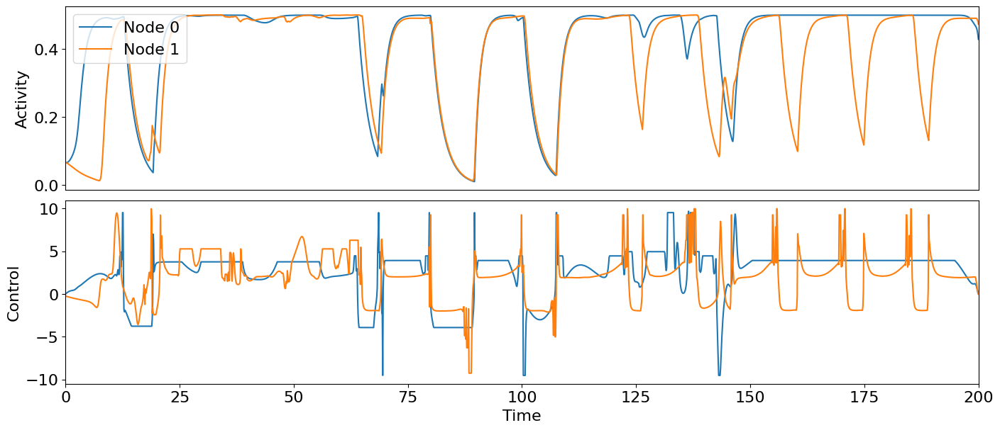

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -482.2553020740013
Converged in iteration 2 with cost -482.2553021073336
Final cost : -482.2553021073336


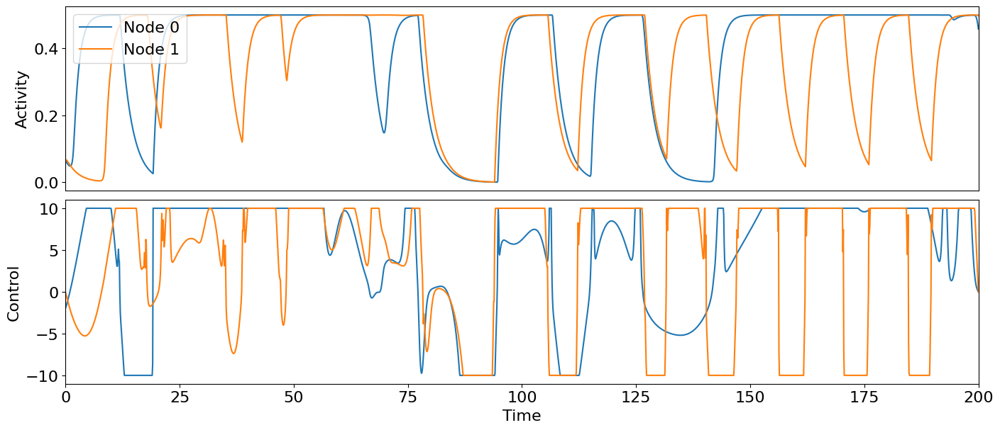

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 1.6502826712149837e-05
Converged in iteration 3 with cost 1.645976430830139e-05
Final cost : 1.645976430830139e-05


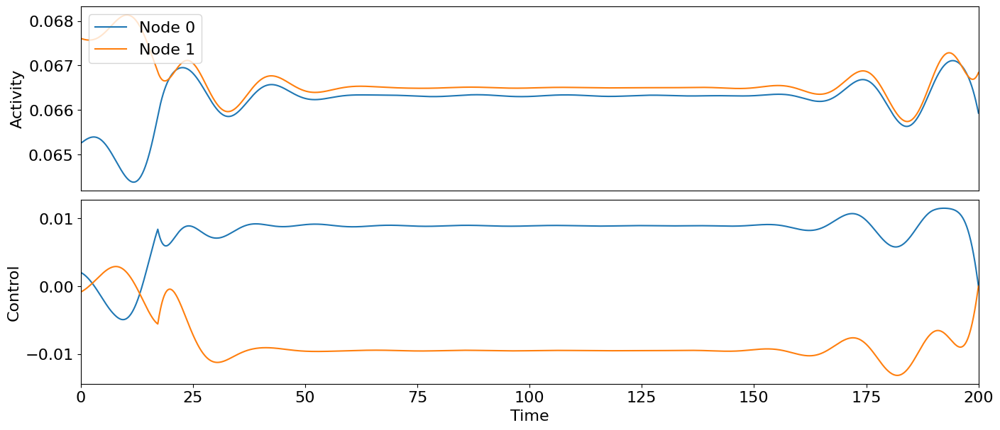

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 5.264574519859085e-07
Converged in iteration 2 with cost 4.2290438572823523e-07
Final cost : 4.2290438572823523e-07


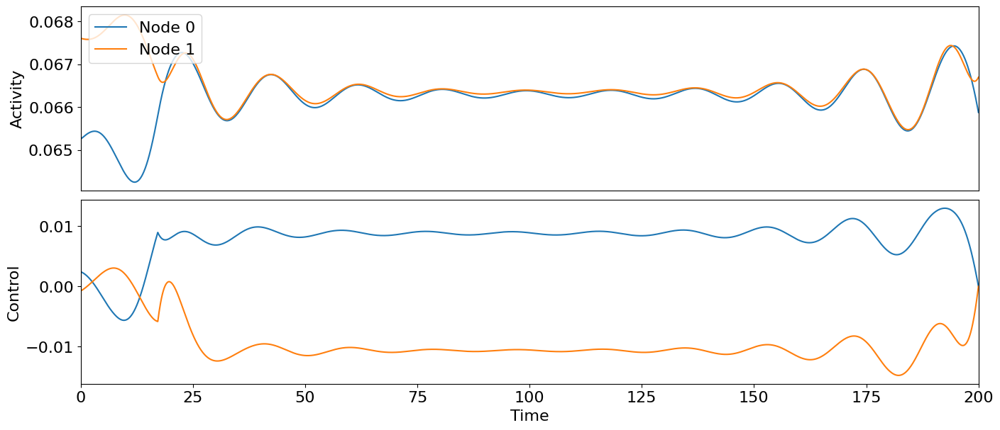

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5259860947129182
Converged in iteration 8 with cost -0.5261444982821332
Final cost : -0.5261444982821332


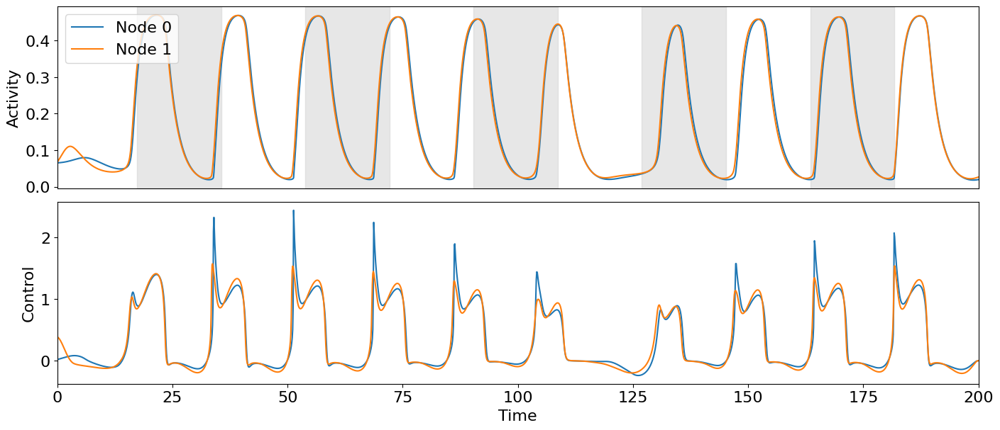

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.6683789707761424
Cost in iteration 10: -0.6683839529433778
Converged in iteration 15 with cost -0.6683895520124585
Final cost : -0.6683895520124585


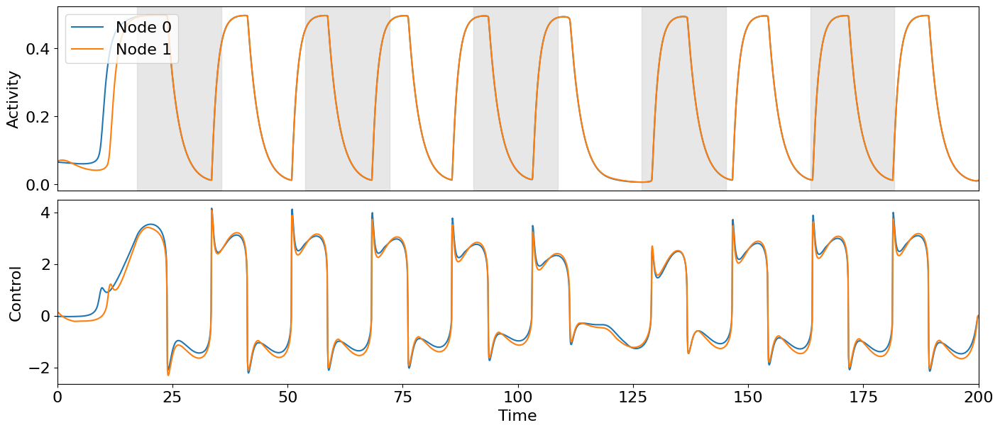

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.939708245509034e-29
Converged in iteration 2 with cost -6.11947299563166e-29
Final cost : -6.11947299563166e-29


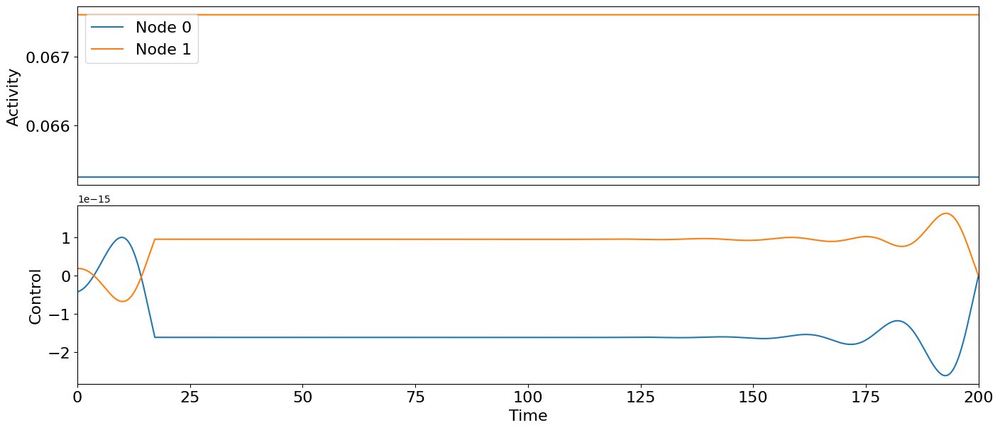

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.961692338912553e-29
Converged in iteration 2 with cost -6.156955743366046e-29
Final cost : -6.156955743366046e-29


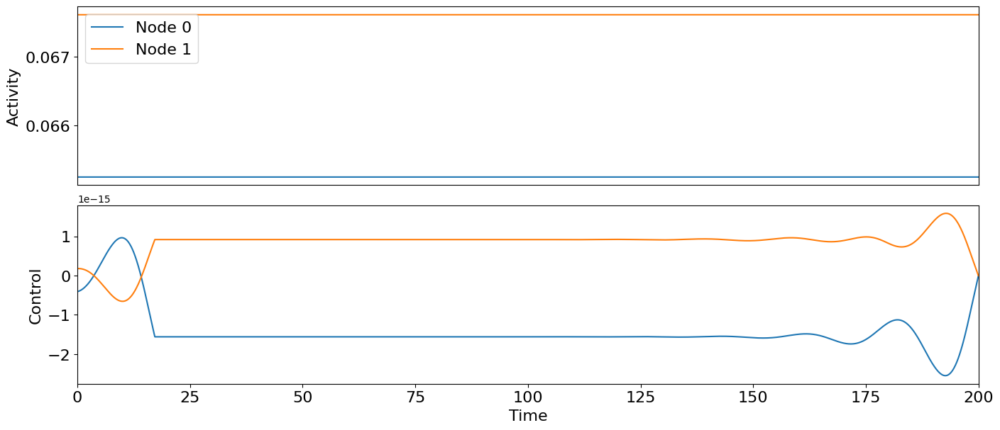

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -610.9829079889464
Converged in iteration 2 with cost -610.982960468963
Final cost : -610.982960468963


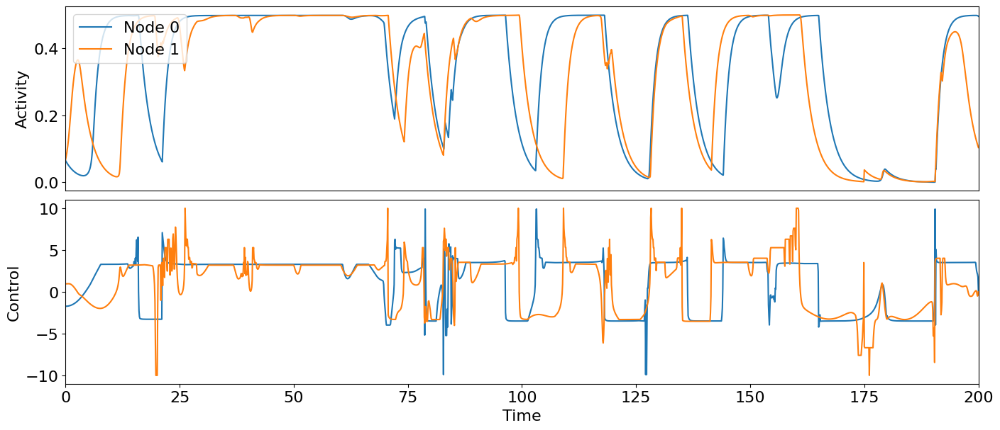

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -589.6999642838716
Converged in iteration 2 with cost -589.6999643198995
Final cost : -589.6999643198995


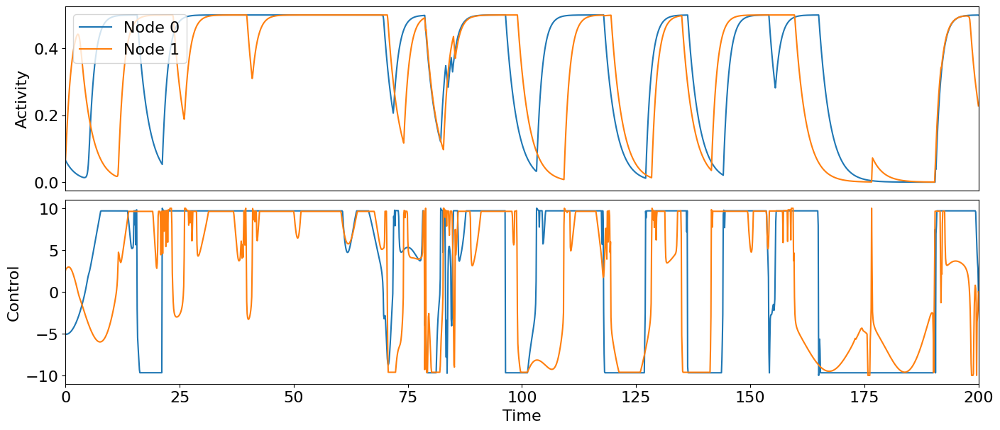

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 1.6502826712149837e-05
Converged in iteration 3 with cost 1.645976430830139e-05
Final cost : 1.645976430830139e-05


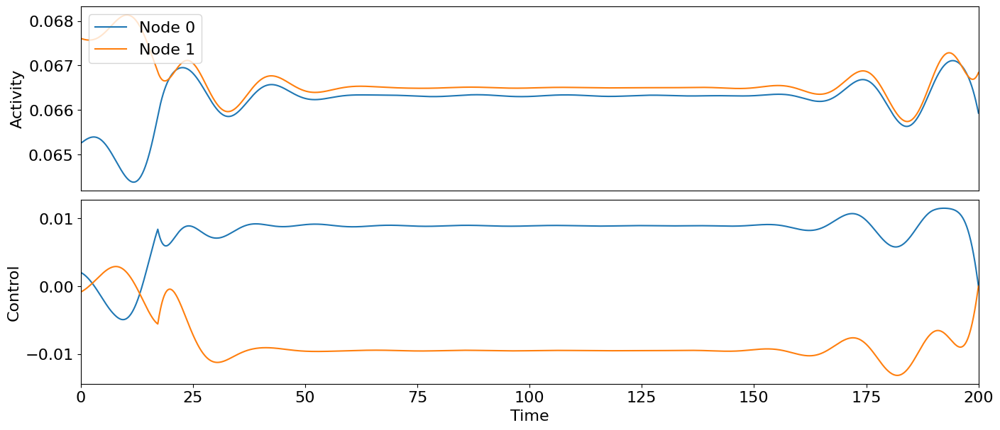

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 5.264574519859085e-07
Converged in iteration 2 with cost 4.2290438572823523e-07
Final cost : 4.2290438572823523e-07


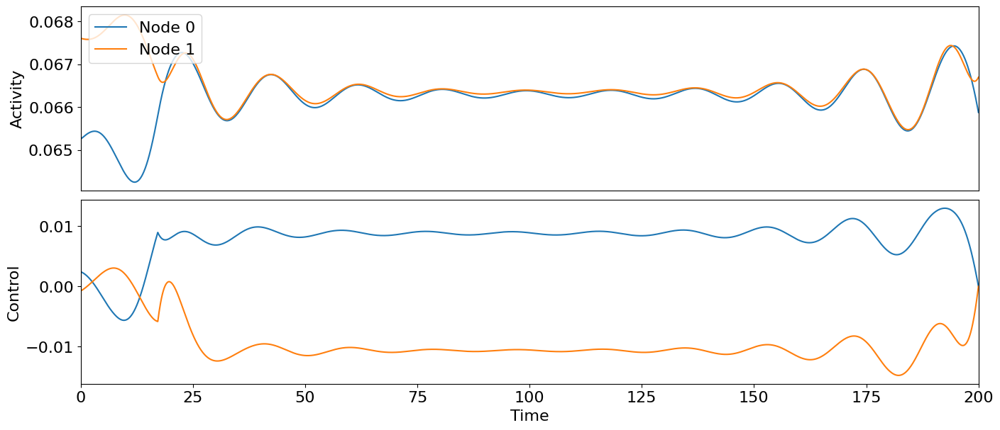

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.3963713994472432
Converged in iteration 6 with cost -0.3972972889755123
Final cost : -0.3972972889755123


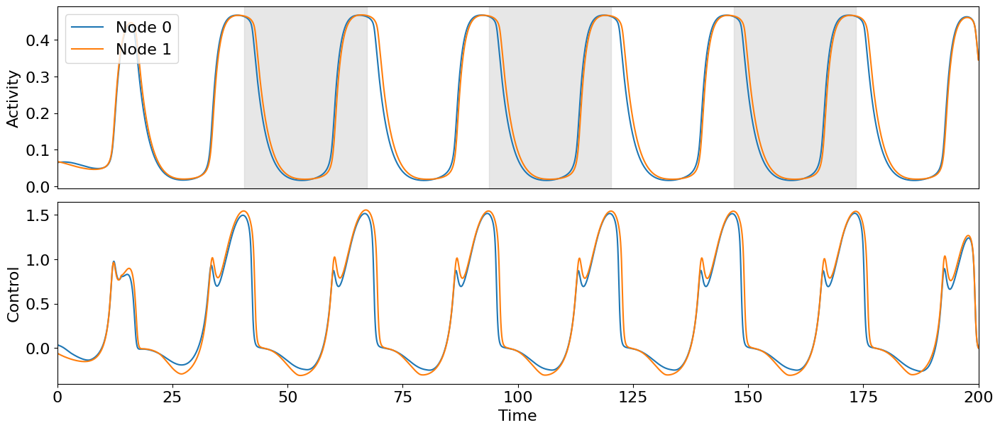

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5689503958996669
Cost in iteration 10: -0.5689504313729682
Converged in iteration 13 with cost -0.5689505011048103
Final cost : -0.5689505011048103


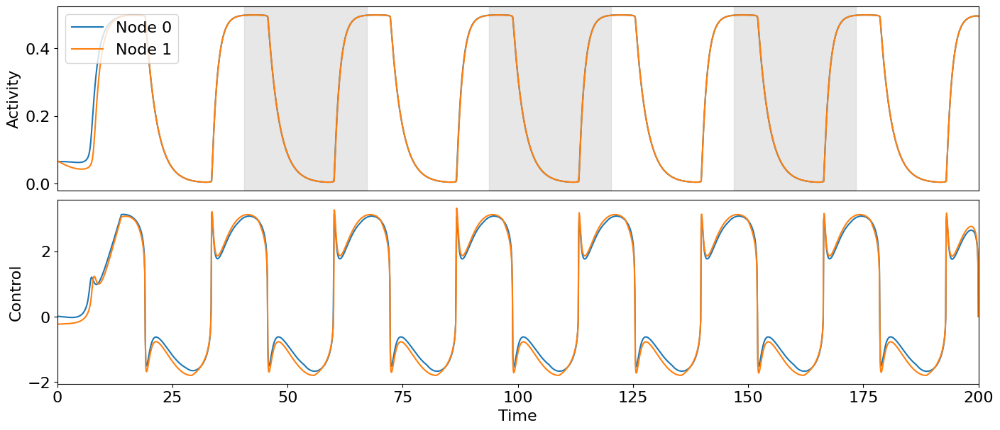

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -6.17236292495872e-29
Converged in iteration 2 with cost -6.367254657357398e-29
Final cost : -6.367254657357398e-29


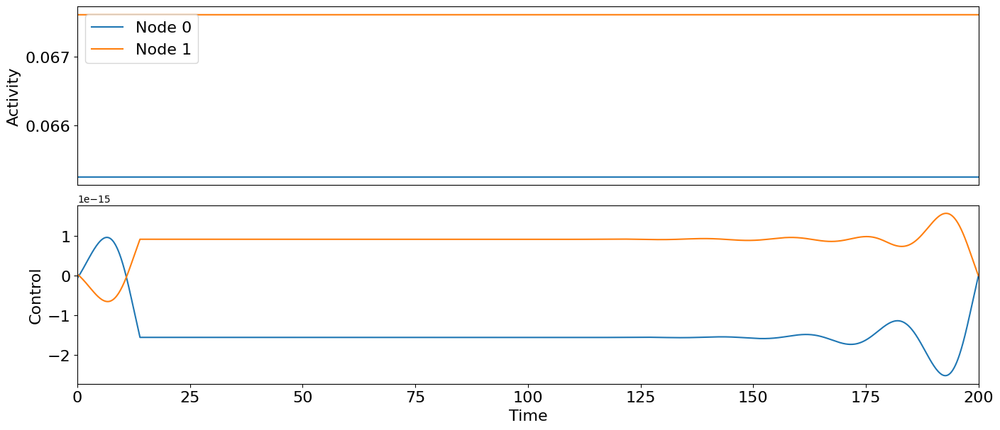

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -6.194489015183721e-29
Converged in iteration 3 with cost -6.396123133869878e-29
Final cost : -6.396123133869878e-29


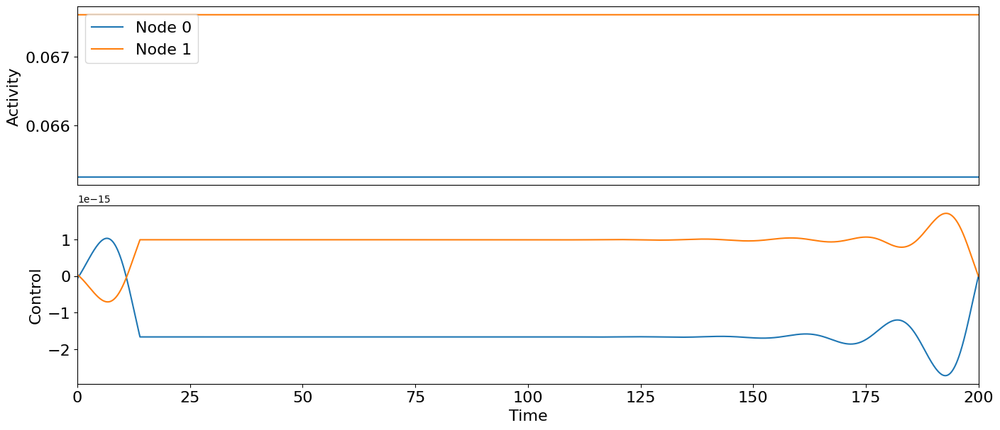

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -646.9919282738347
Converged in iteration 3 with cost -651.0777869108712
Final cost : -651.0777869108712


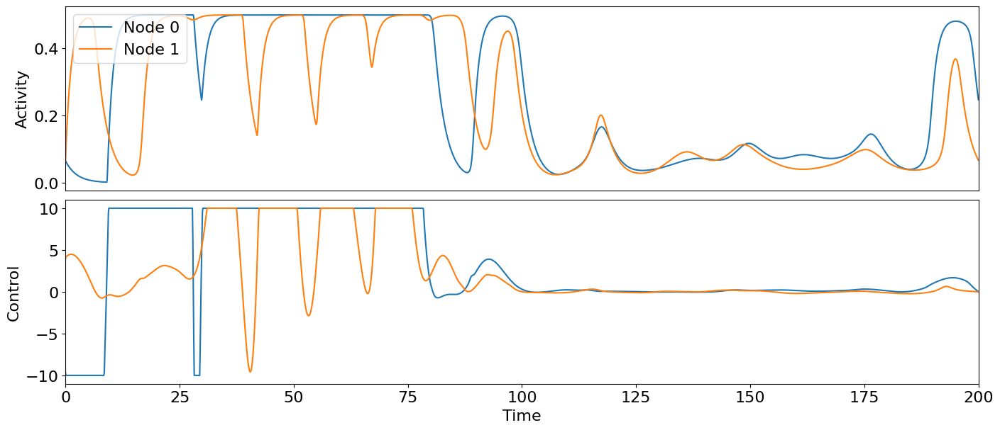

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -653.2565977589647
Converged in iteration 2 with cost -655.2971587868785
Final cost : -655.2971587868785


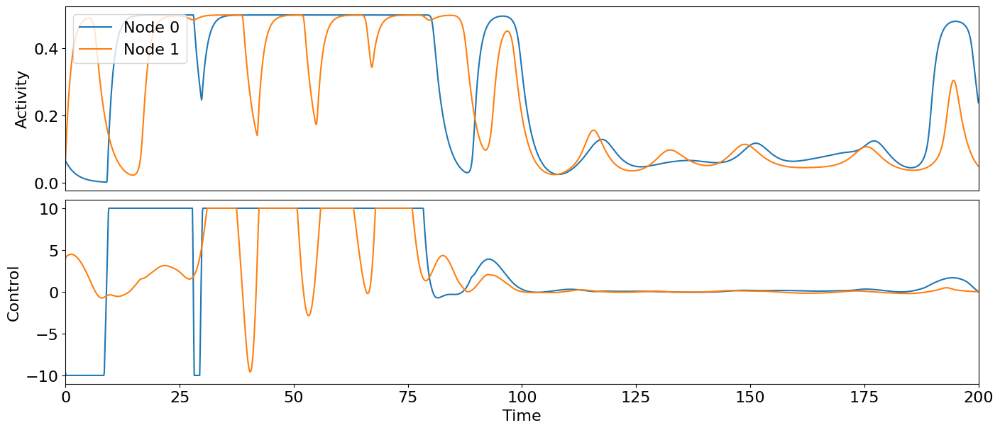

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 1.679860173074392e-05
Converged in iteration 3 with cost 1.6755452551182477e-05
Final cost : 1.6755452551182477e-05


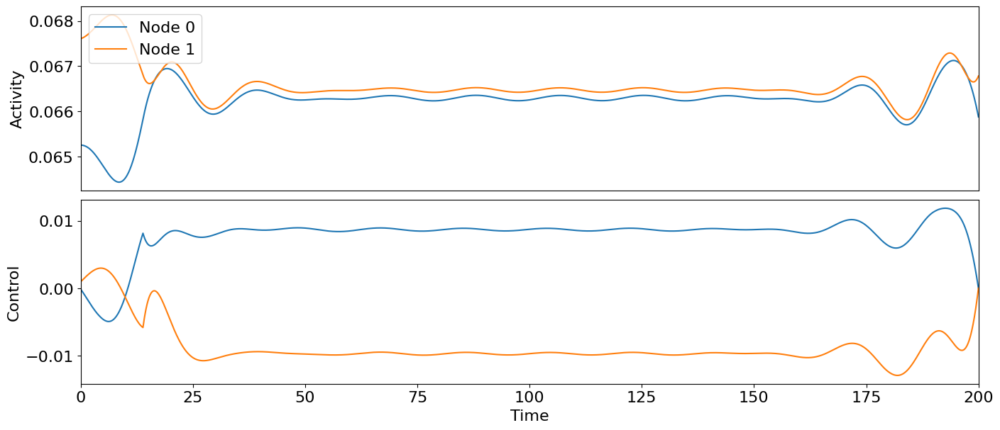

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 3.3915771379479737e-07
Converged in iteration 3 with cost 2.7983593345422964e-07
Final cost : 2.7983593345422964e-07


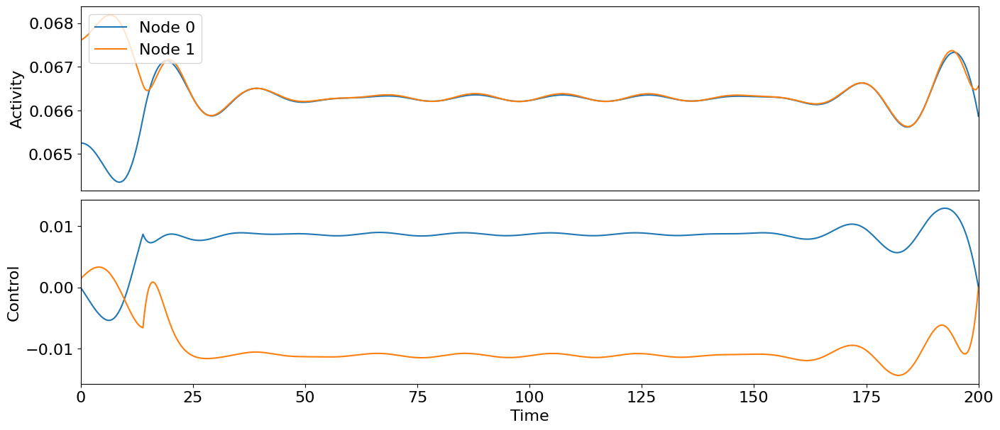

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.30135788295316324
Converged in iteration 9 with cost -0.33078921452348947
Final cost : -0.33078921452348947


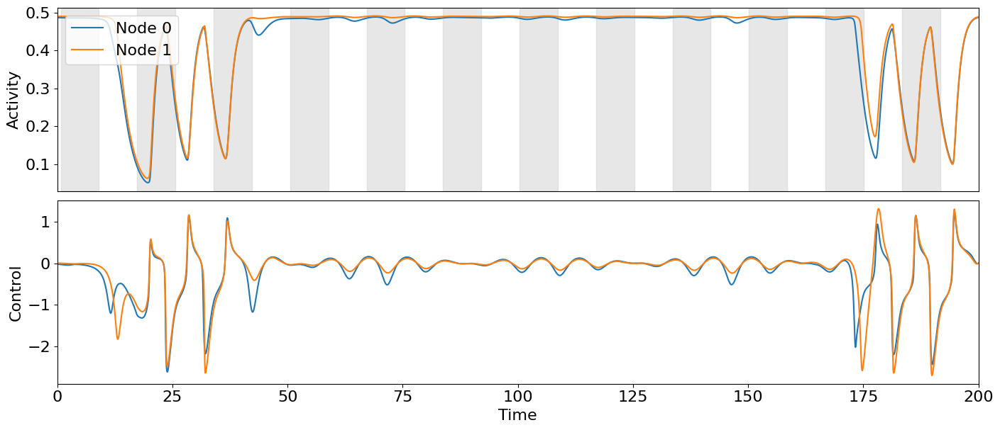

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8190603636058208
Cost in iteration 10: -0.8202718179059125
Converged in iteration 13 with cost -0.8205240612062691
Final cost : -0.8205240612062691


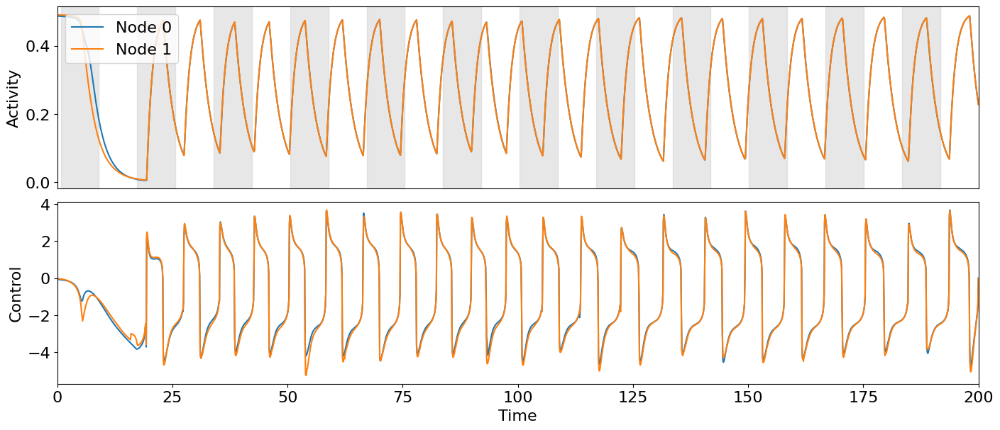

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -4.5202564952386345e-27
Converged in iteration 2 with cost -4.5202564952386345e-27
Final cost : -4.5202564952386345e-27


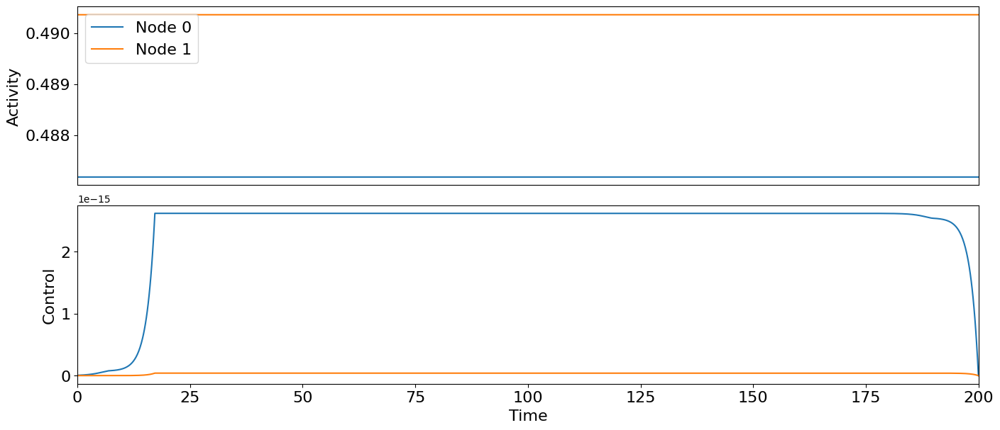

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -4.520848178285221e-27
Converged in iteration 2 with cost -4.520848178285221e-27
Final cost : -4.520848178285221e-27


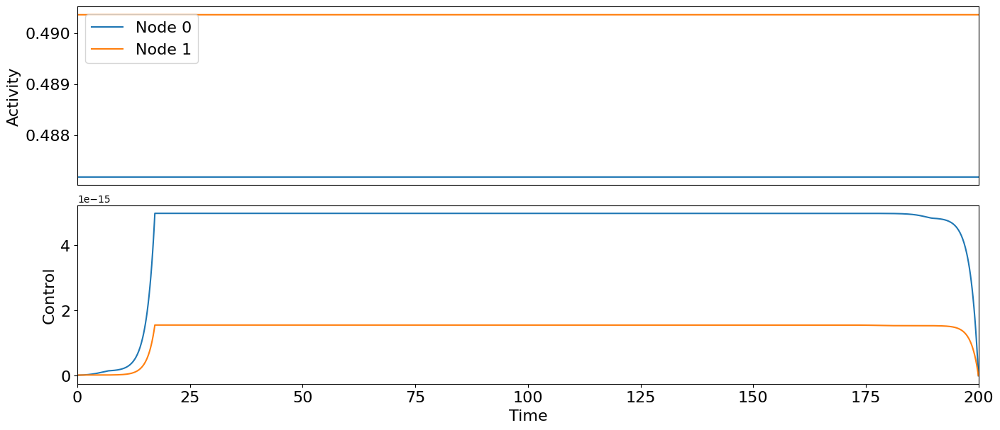

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -24.595868060763415
Converged in iteration 2 with cost -24.595868060763415
Final cost : -24.595868060763415


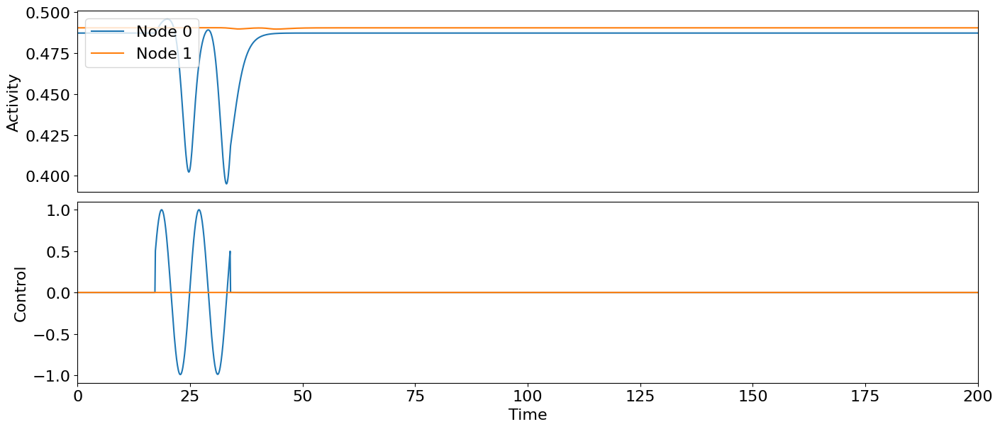

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -324.60758546730085
Cost in iteration 10: -324.8318871473509
Cost in iteration 20: -324.83188714888973
Converged in iteration 24 with cost -324.8318871488901
Final cost : -324.8318871488901


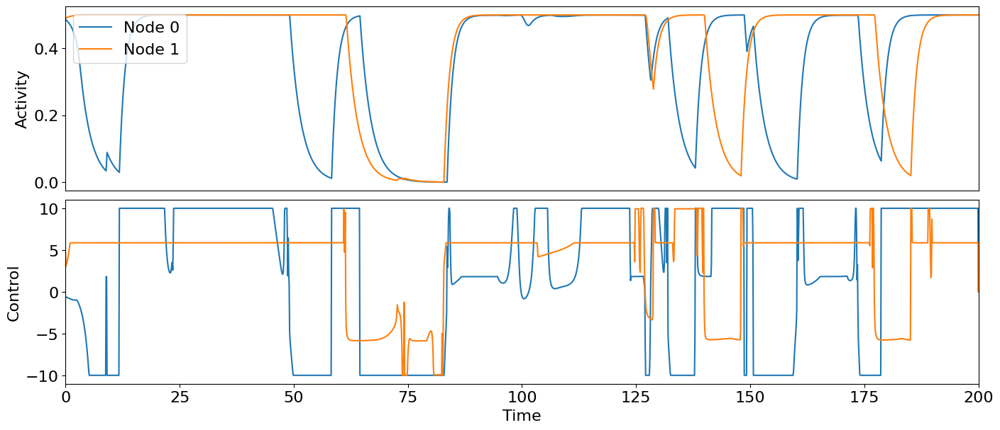

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.000255207137560232
Converged in iteration 2 with cost 0.000255207137560232
Final cost : 0.000255207137560232


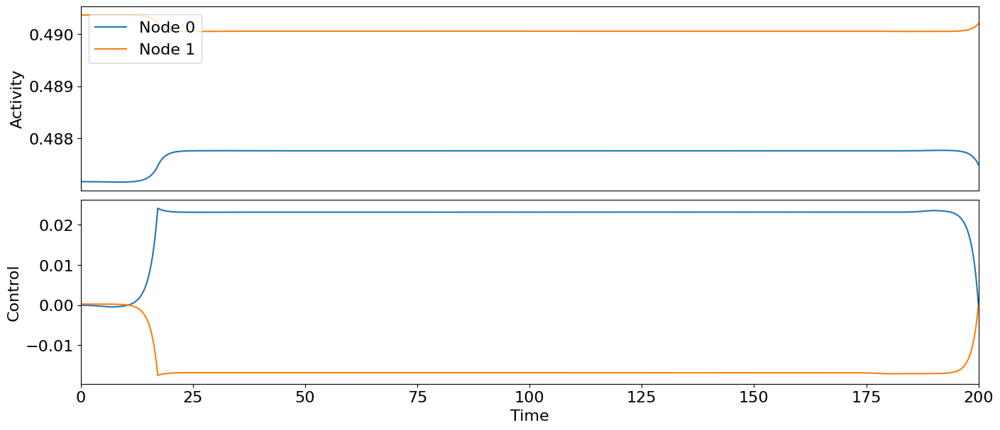

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 9.722531688655242e-06
Converged in iteration 2 with cost 9.722531688655242e-06
Final cost : 9.722531688655242e-06


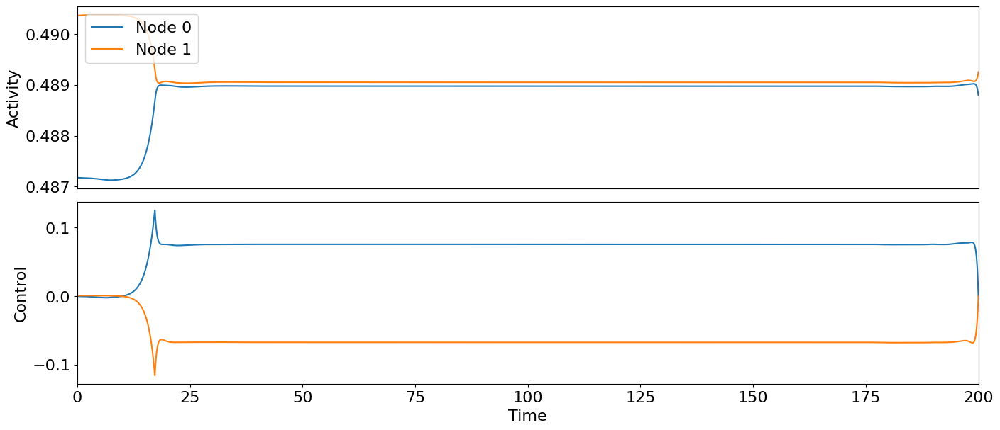

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.4508520436395103
Converged in iteration 6 with cost -0.47895661938521406
Final cost : -0.47895661938521406


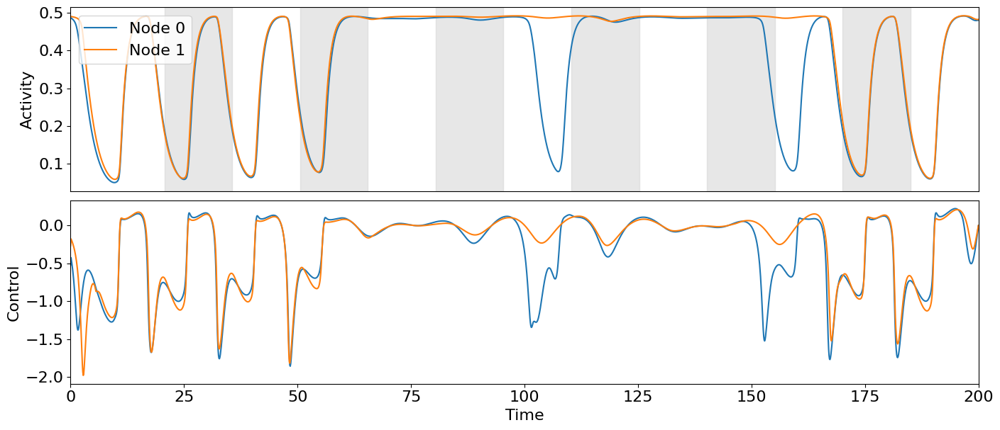

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8343270100875209
Cost in iteration 10: -0.8345554843065467
Converged in iteration 15 with cost -0.8349062632130188
Final cost : -0.8349062632130188


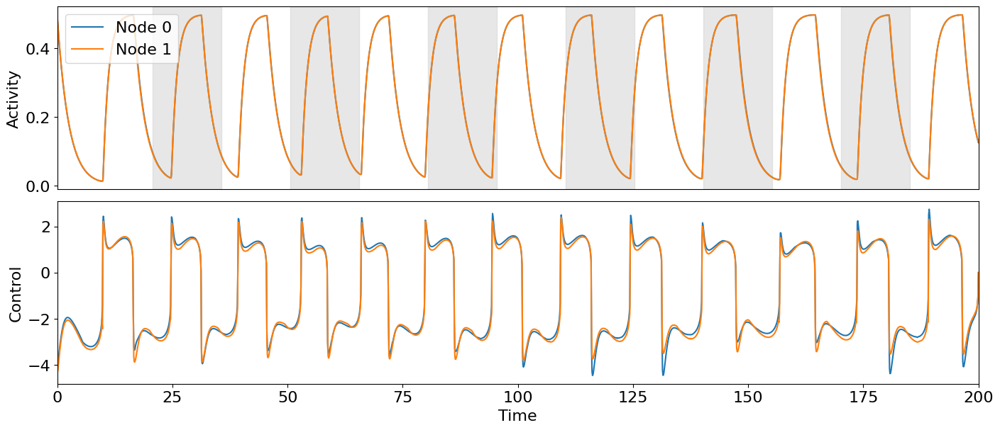

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -7.358211027013784e-27
Converged in iteration 2 with cost -7.358211027013784e-27
Final cost : -7.358211027013784e-27


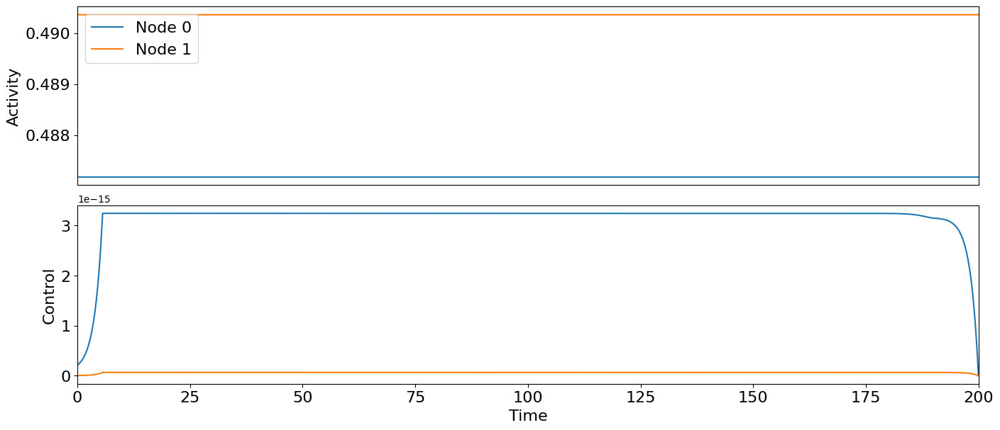

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.724020876570439e-26
Converged in iteration 2 with cost -5.080306784631686e-26
Final cost : -5.080306784631686e-26


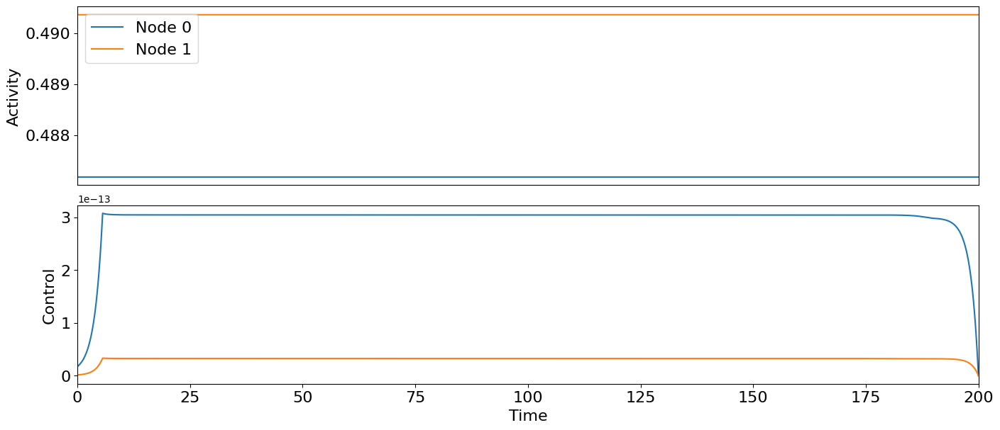

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -379.5552757196512
Converged in iteration 2 with cost -379.55572331376294
Final cost : -379.55572331376294


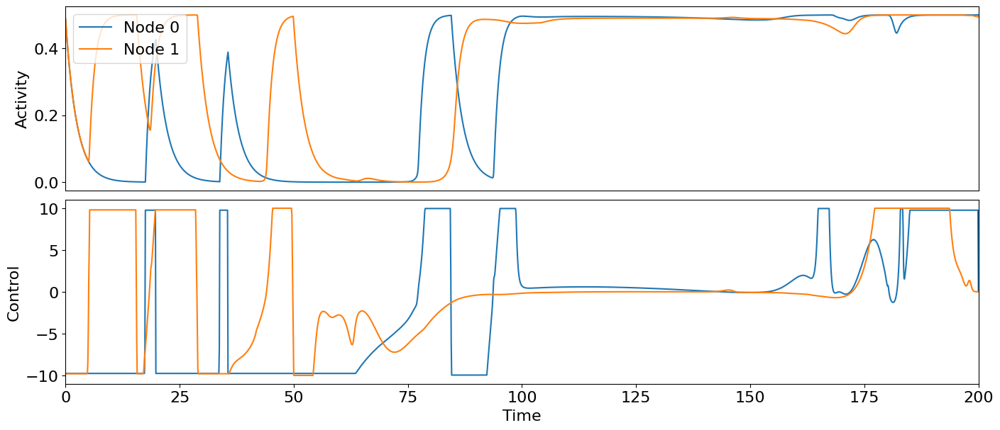

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -46.914072495201026
Converged in iteration 3 with cost -46.91407249520103
Final cost : -46.91407249520103


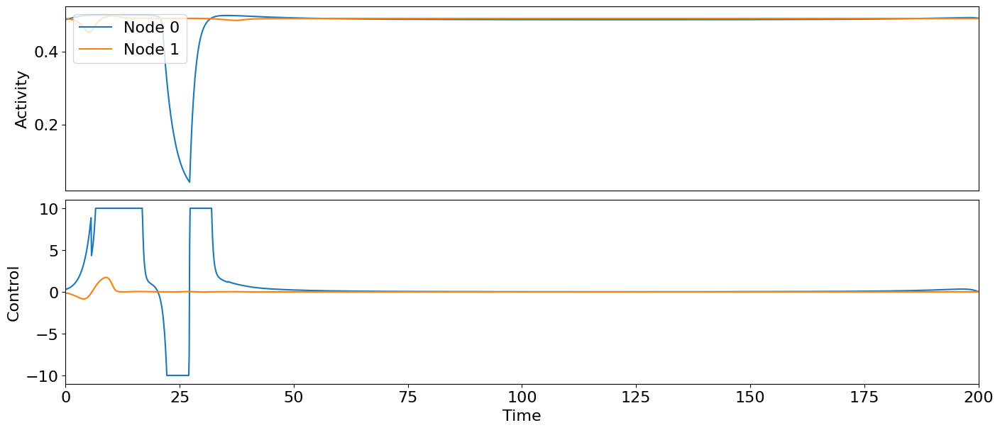

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.0002713660491824028
Converged in iteration 2 with cost 0.0002713660491824028
Final cost : 0.0002713660491824028


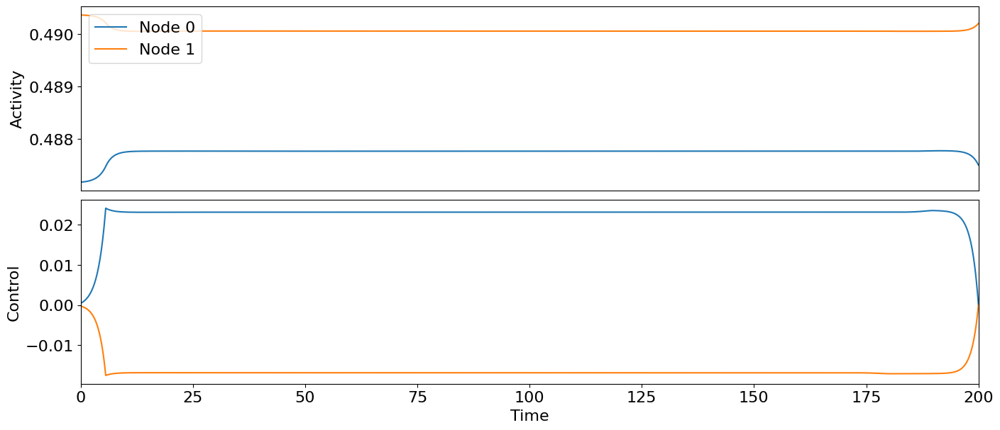

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 1.0331258781264795e-05
Converged in iteration 2 with cost 1.0331258781264795e-05
Final cost : 1.0331258781264795e-05


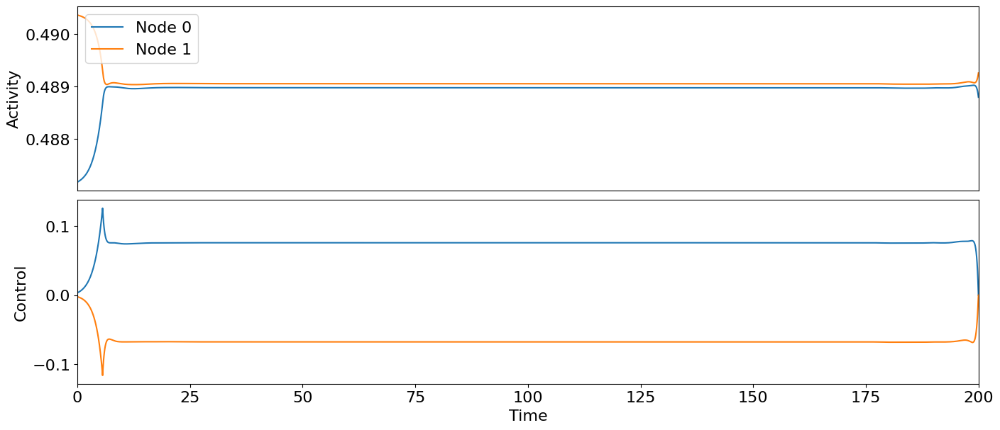

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.22527328078020287
Converged in iteration 4 with cost -0.31769713623956736
Final cost : -0.31769713623956736


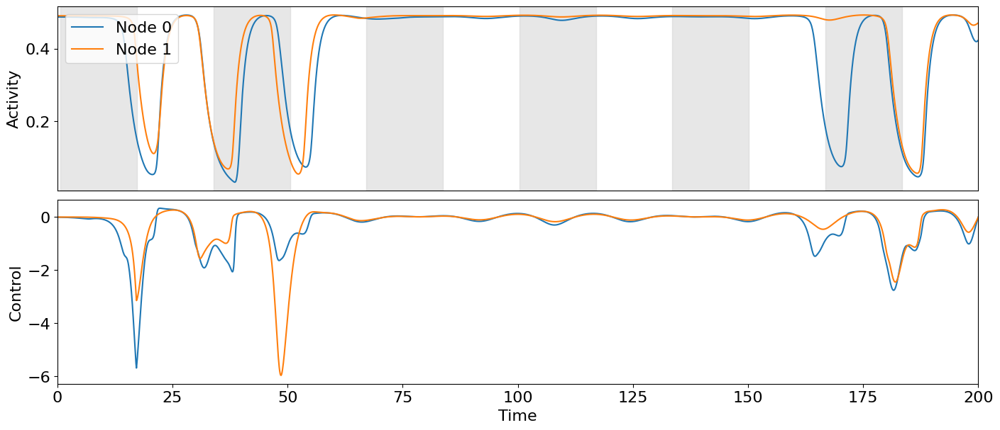

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.867313336299855
Cost in iteration 10: -0.8674651904001034
Converged in iteration 12 with cost -0.8675177992501132
Final cost : -0.8675177992501132


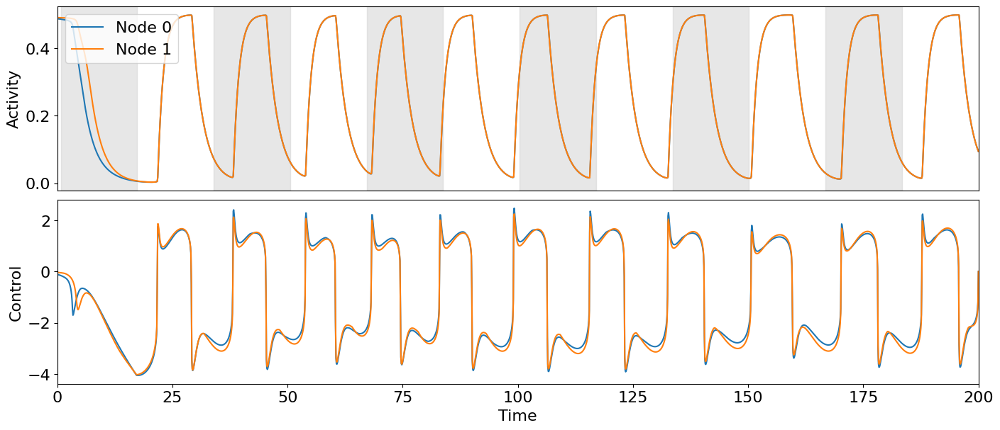

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -4.5202564952386345e-27
Converged in iteration 2 with cost -4.5202564952386345e-27
Final cost : -4.5202564952386345e-27


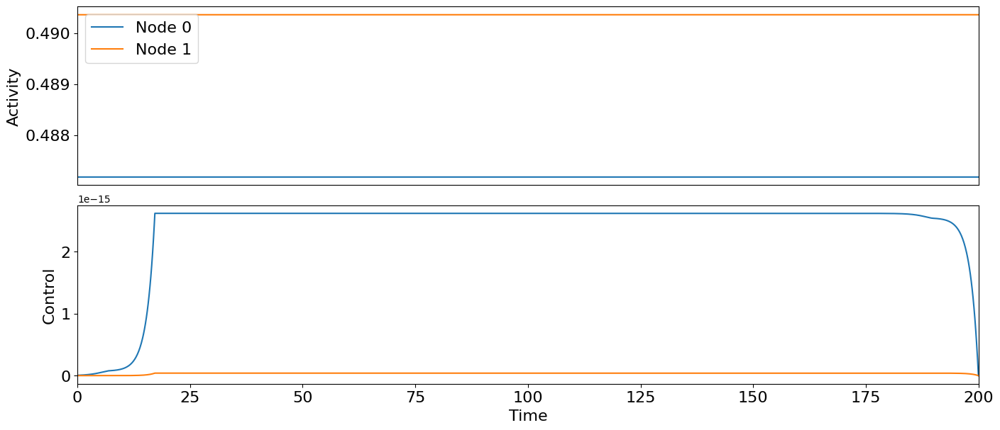

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -4.520848178285221e-27
Converged in iteration 2 with cost -4.520848178285221e-27
Final cost : -4.520848178285221e-27


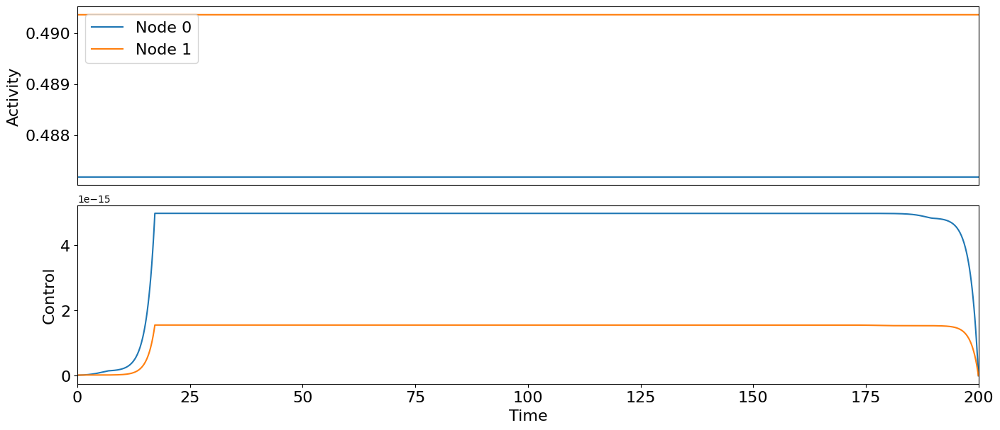

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -74.55351243580492
Converged in iteration 2 with cost -74.55351243580492
Final cost : -74.55351243580492


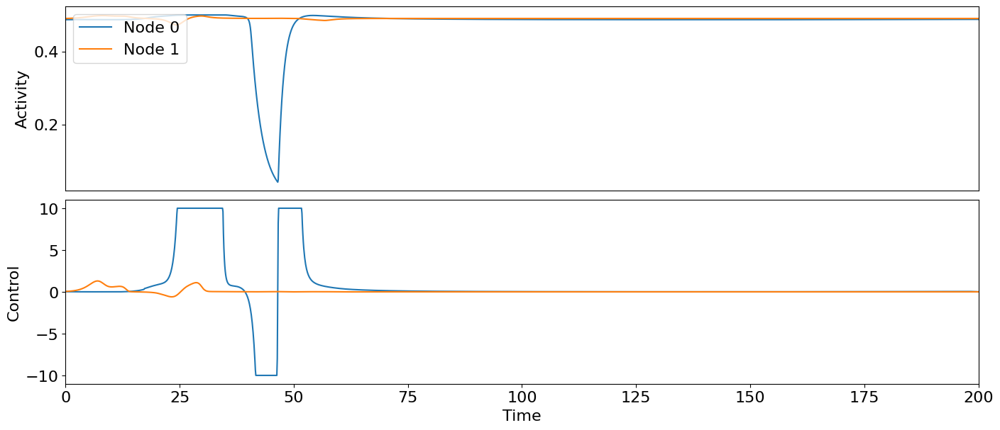

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -77.79989133863963
Converged in iteration 2 with cost -77.79989133863963
Final cost : -77.79989133863963


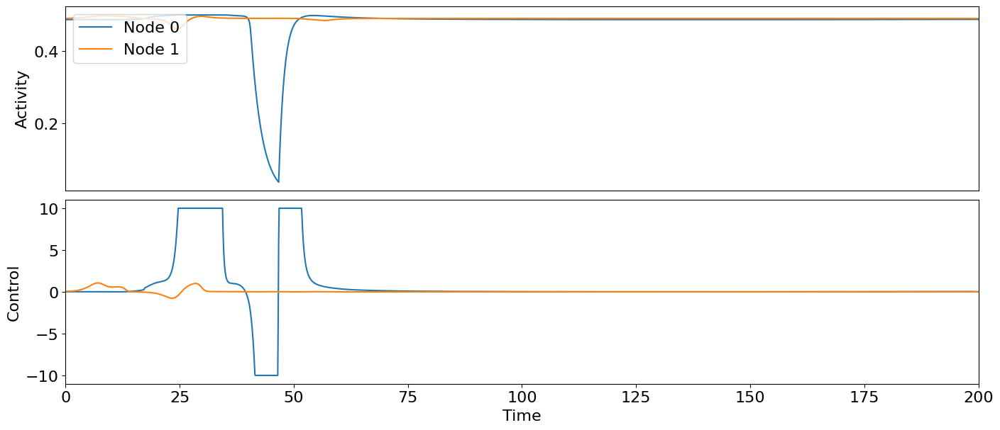

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.000255207137560232
Converged in iteration 2 with cost 0.000255207137560232
Final cost : 0.000255207137560232


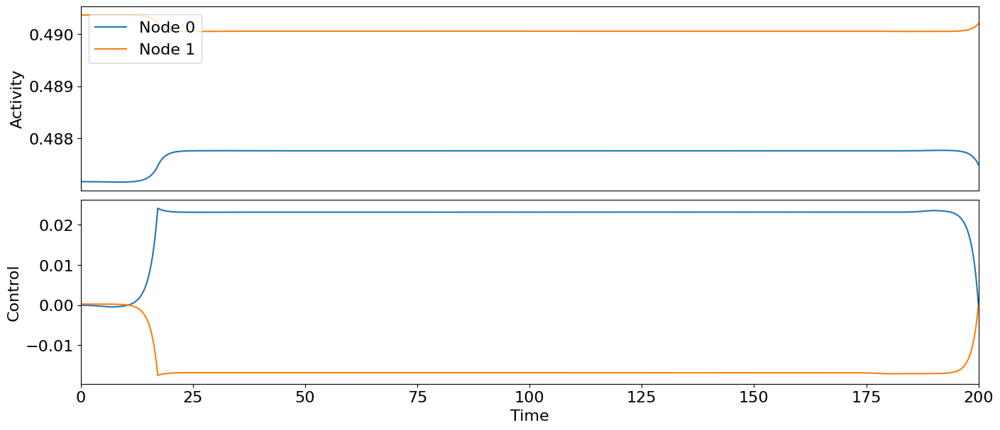

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 9.722531688655242e-06
Converged in iteration 2 with cost 9.722531688655242e-06
Final cost : 9.722531688655242e-06


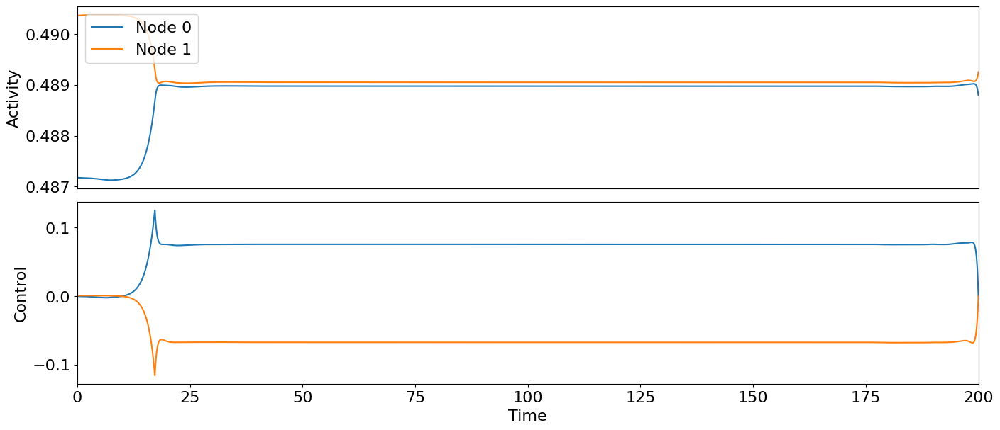

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.4183511846357075
Converged in iteration 4 with cost -0.43131469497909847
Final cost : -0.43131469497909847


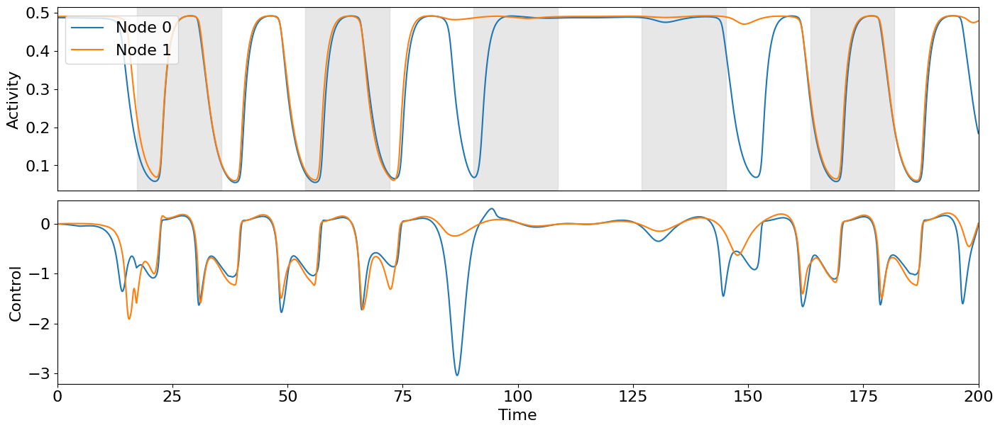

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.6686731667298154
Cost in iteration 10: -0.6689772370641894
Converged in iteration 13 with cost -0.6691251413630124
Final cost : -0.6691251413630124


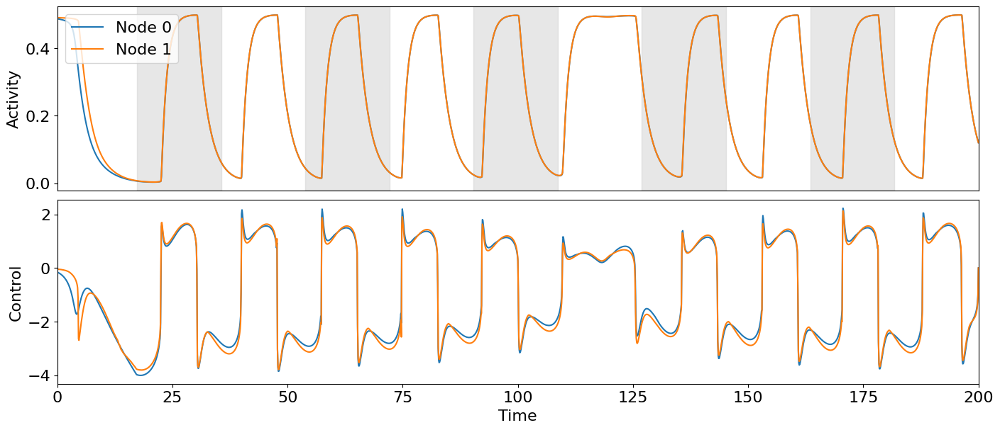

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -4.5202564952386345e-27
Converged in iteration 2 with cost -4.5202564952386345e-27
Final cost : -4.5202564952386345e-27


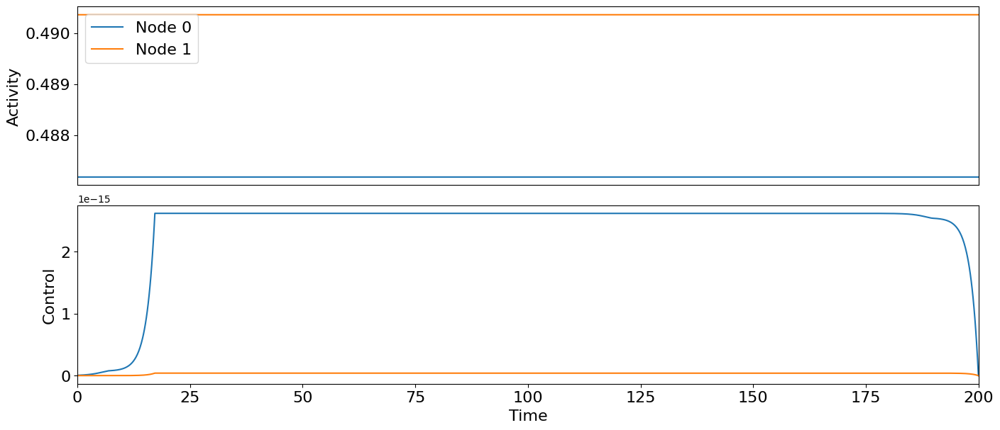

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -4.520848178285221e-27
Converged in iteration 2 with cost -4.520848178285221e-27
Final cost : -4.520848178285221e-27


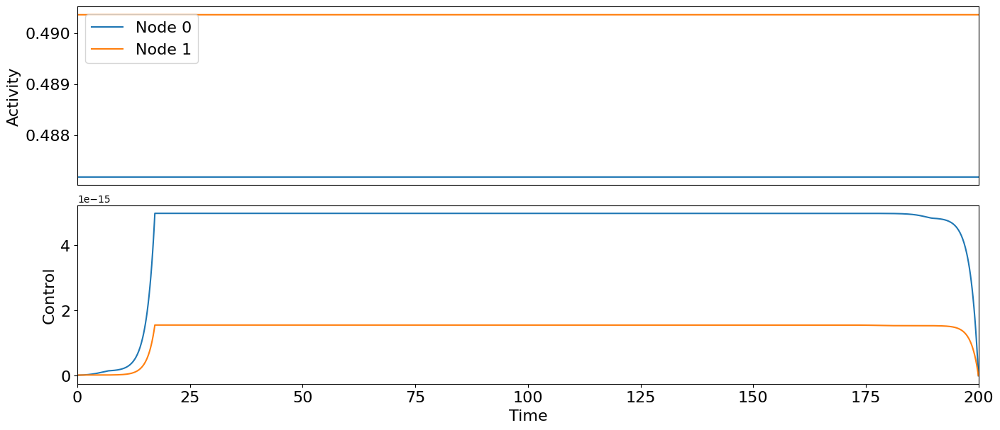

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -130.94801341128587
Cost in iteration 10: -130.94801341143716
Converged in iteration 11 with cost -130.94801341143716
Final cost : -130.94801341143716


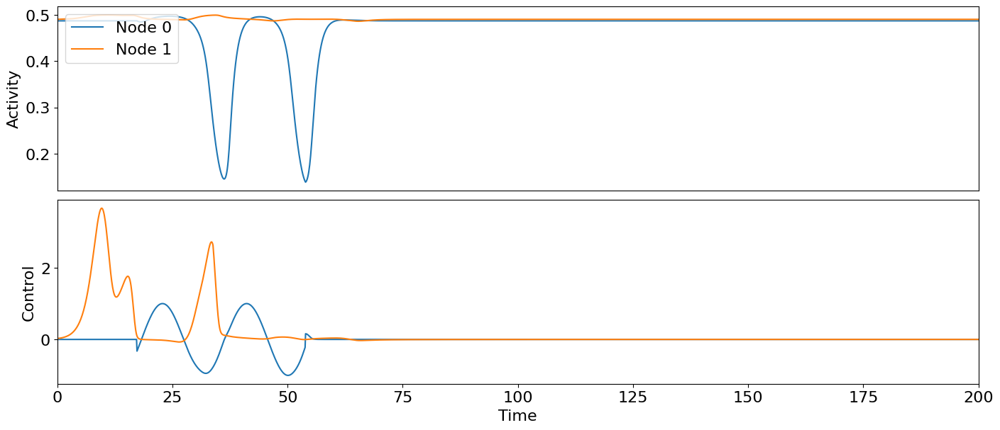

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -84.91760185222468
Converged in iteration 2 with cost -84.91760185222468
Final cost : -84.91760185222468


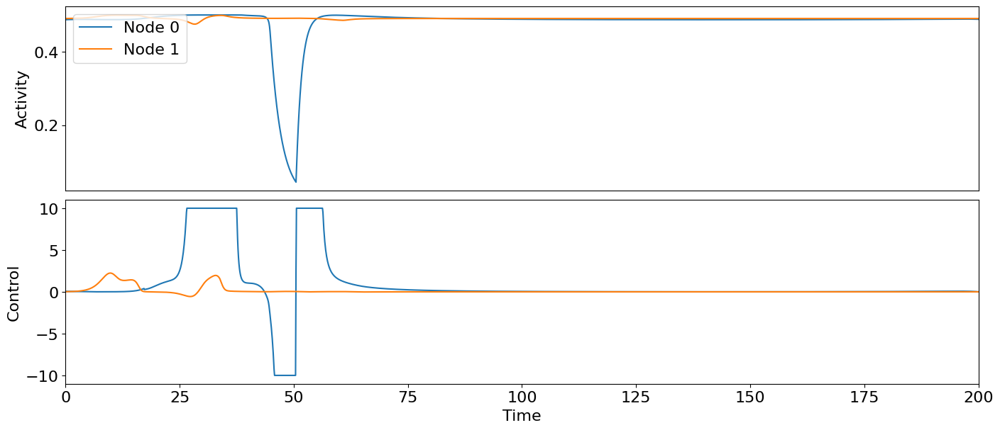

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.000255207137560232
Converged in iteration 2 with cost 0.000255207137560232
Final cost : 0.000255207137560232


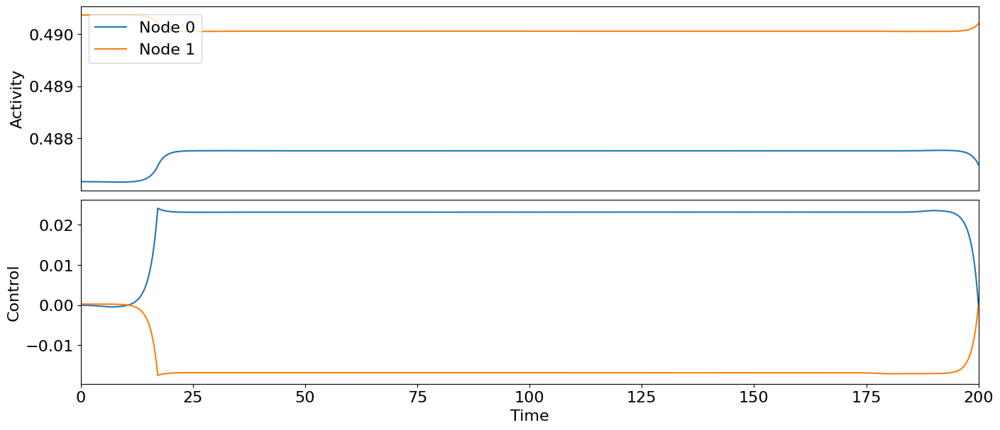

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 9.722531688655242e-06
Converged in iteration 2 with cost 9.722531688655242e-06
Final cost : 9.722531688655242e-06


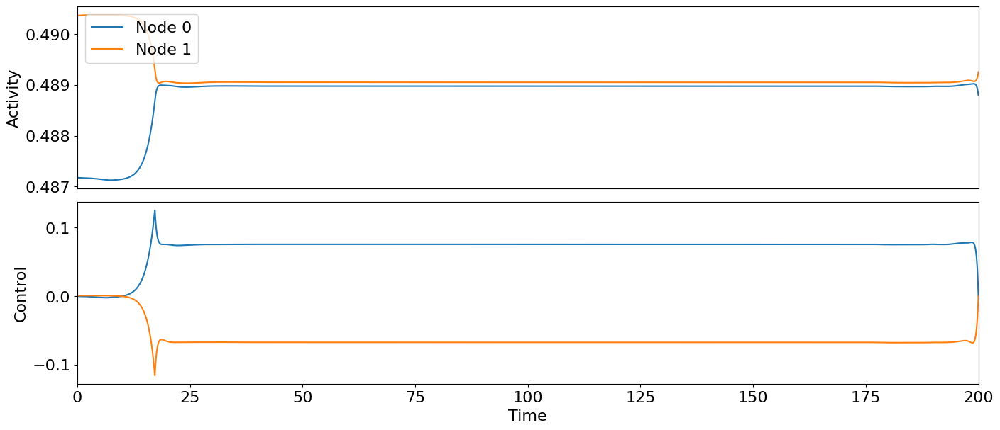

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.3542938212308507
Converged in iteration 6 with cost -0.3604262194828017
Final cost : -0.3604262194828017


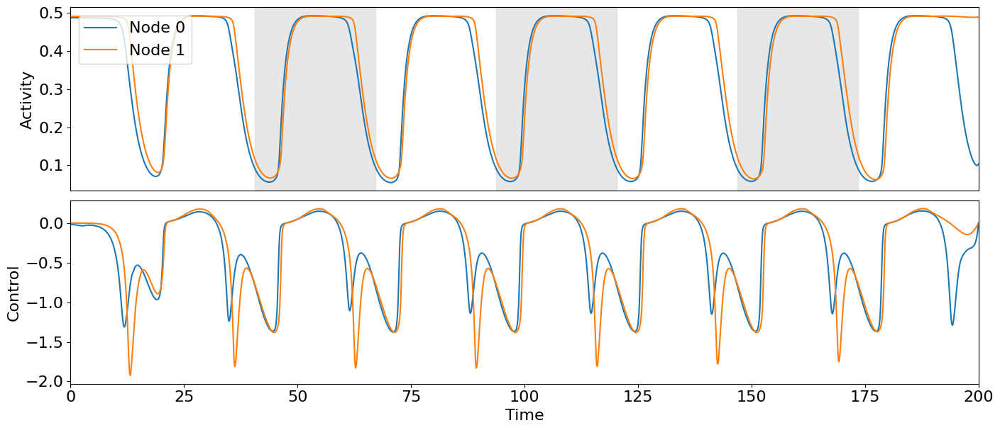

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5679963472955242
Cost in iteration 10: -0.5680085109183309
Converged in iteration 14 with cost -0.5680129603475202
Final cost : -0.5680129603475202


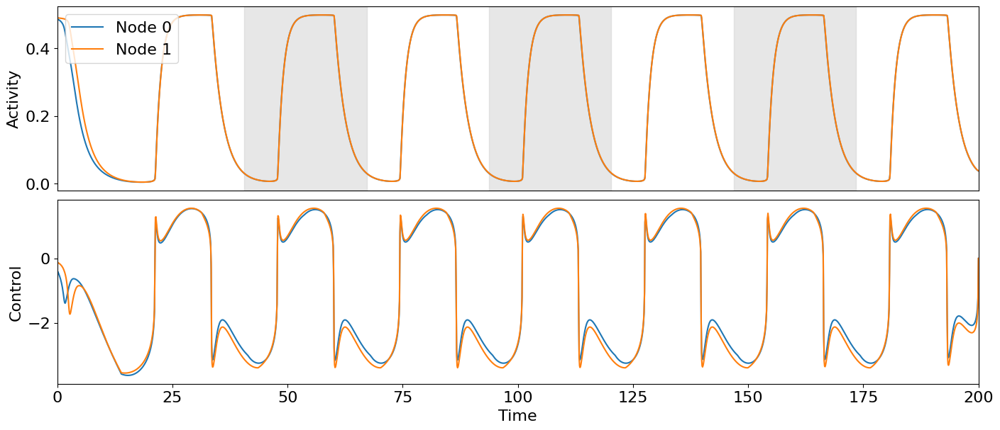

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.2810401922468e-27
Converged in iteration 2 with cost -5.2810401922468e-27
Final cost : -5.2810401922468e-27


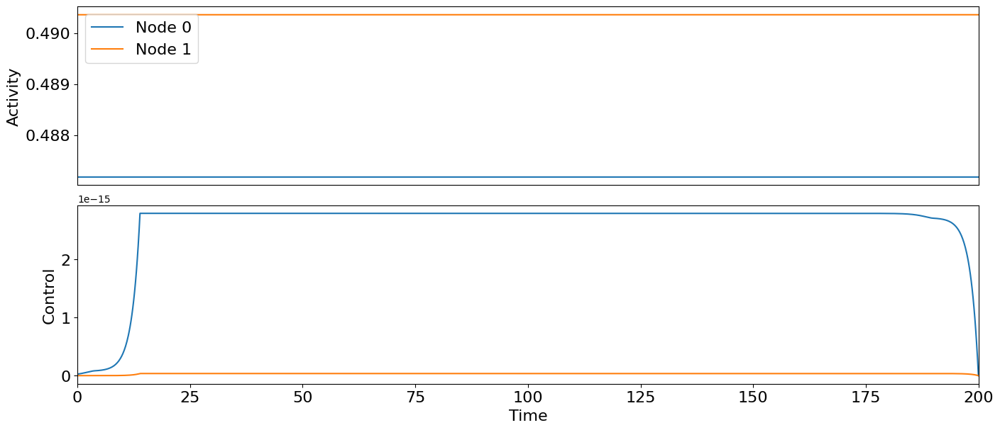

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -5.281730818876375e-27
Converged in iteration 2 with cost -5.281730818876375e-27
Final cost : -5.281730818876375e-27


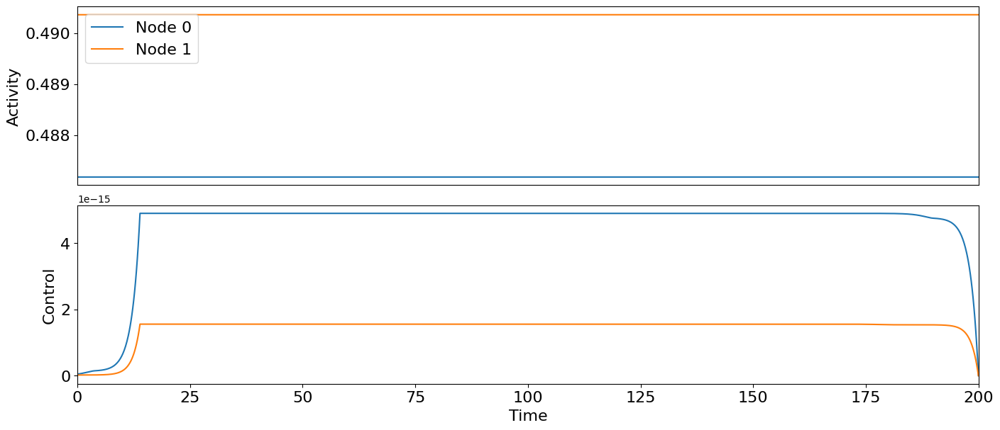

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -701.754720466221
Converged in iteration 2 with cost -701.771515926788
Final cost : -701.771515926788


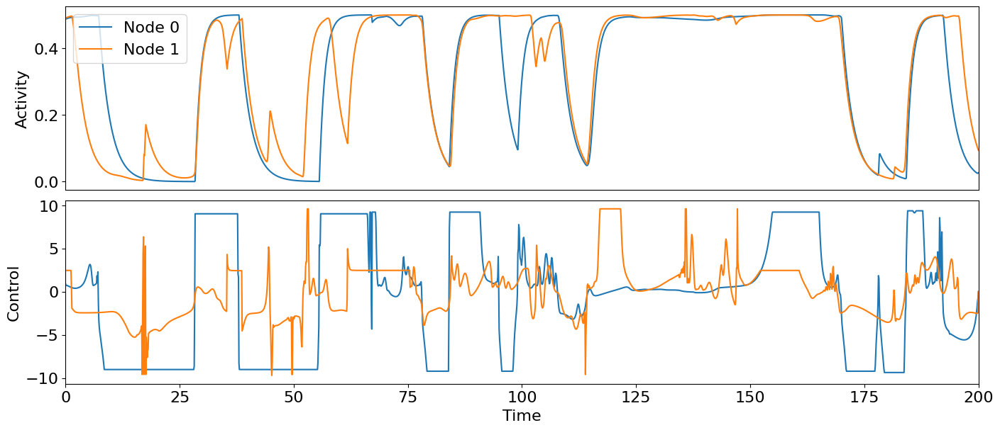

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -130.63428357366757
Converged in iteration 2 with cost -130.63428357366757
Final cost : -130.63428357366757


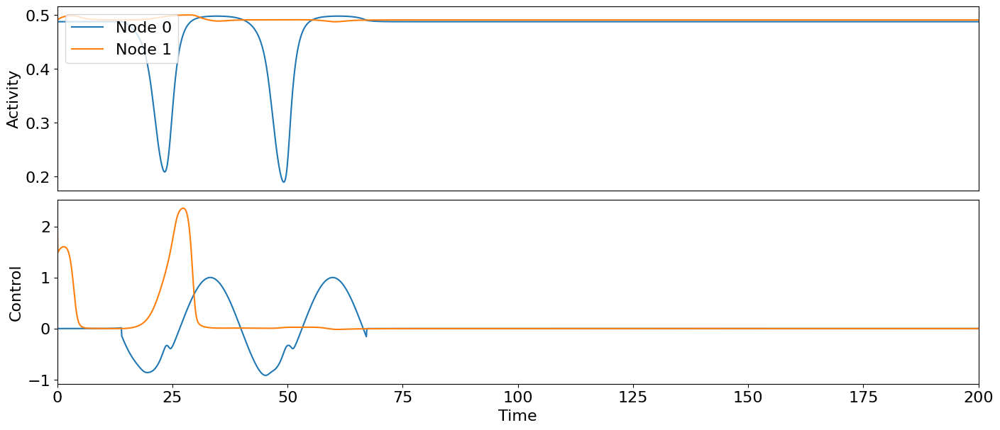

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.0002598040795267768
Converged in iteration 2 with cost 0.0002598040795267768
Final cost : 0.0002598040795267768


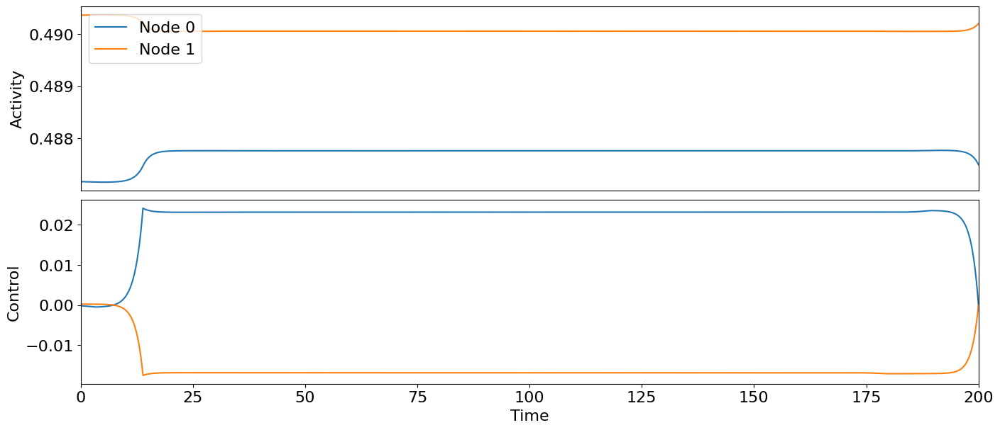

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 9.895690556963597e-06
Converged in iteration 2 with cost 9.895690556963597e-06
Final cost : 9.895690556963597e-06


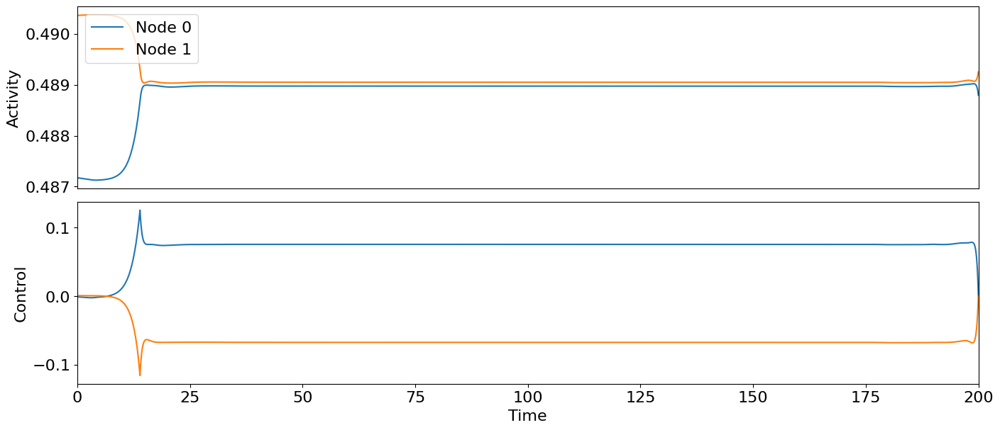

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.1441599422784246
Converged in iteration 2 with cost -0.14552508200527384
Final cost : -0.14552508200527384


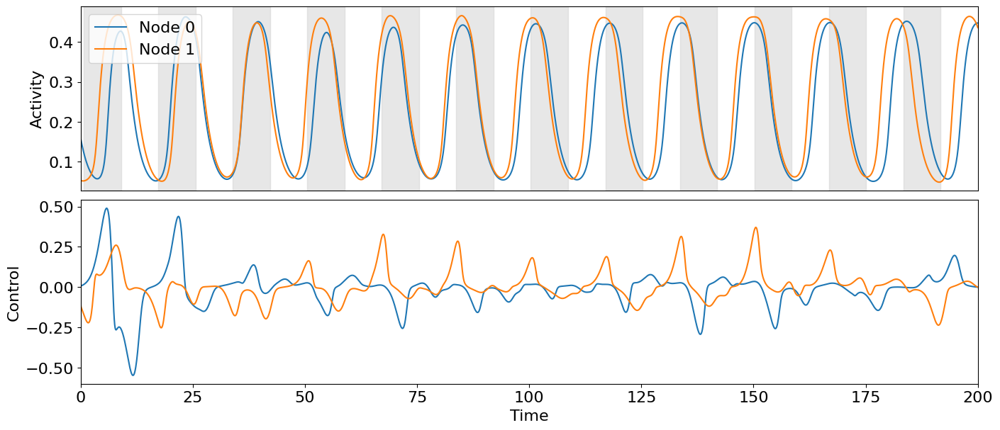

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.14649750437154122
Converged in iteration 2 with cost -0.148352655370194
Final cost : -0.148352655370194


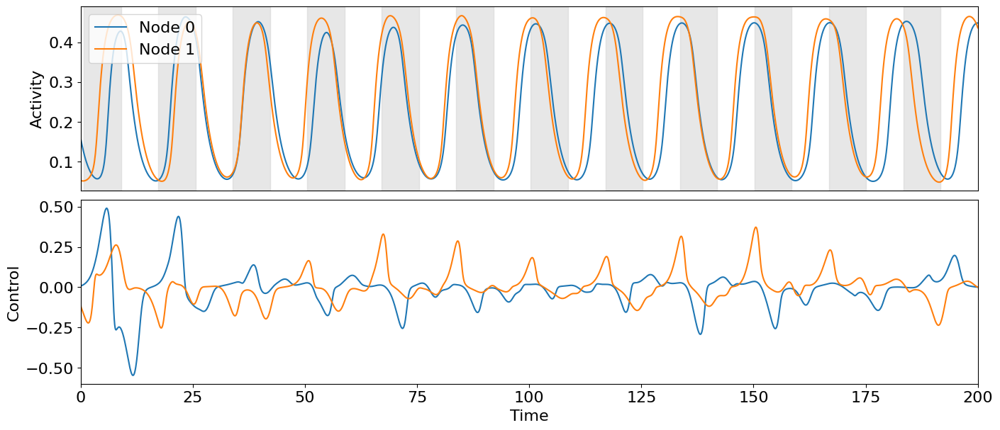

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.255317737511224
Converged in iteration 2 with cost -2.255317737511224
Final cost : -2.255317737511224


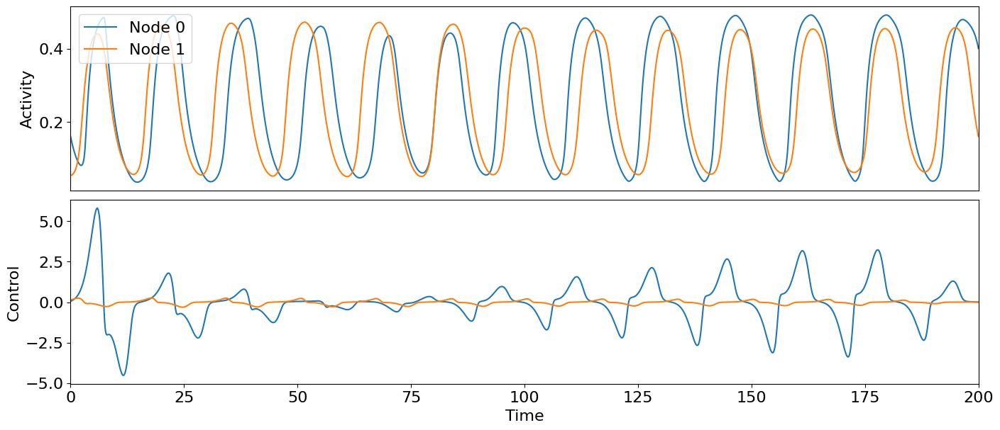

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.4330338047911106
Converged in iteration 2 with cost -2.4330338047911106
Final cost : -2.4330338047911106


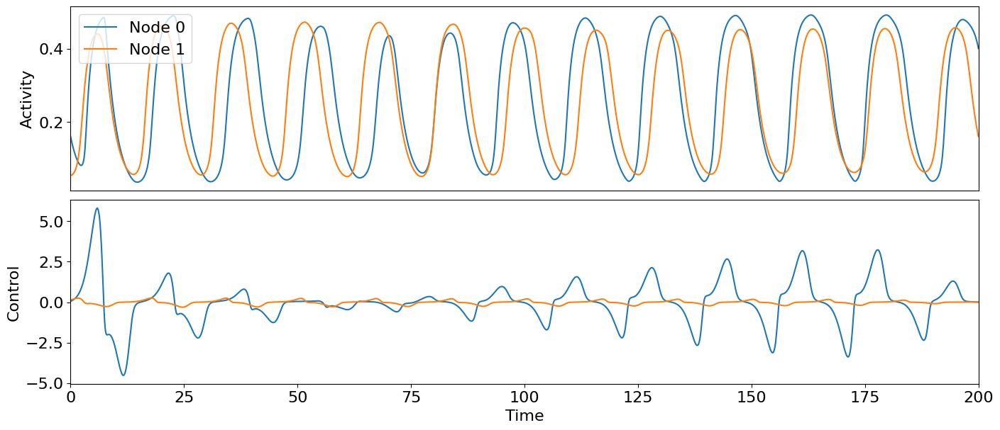

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -658.6235755240756
Converged in iteration 7 with cost -677.8264098780235
Final cost : -677.8264098780235


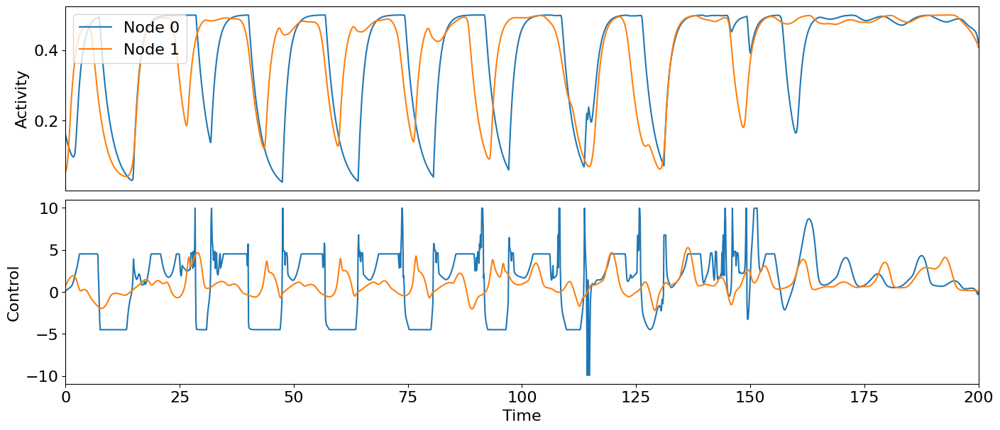

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -658.3024095379508
Converged in iteration 2 with cost -658.3219374081757
Final cost : -658.3219374081757


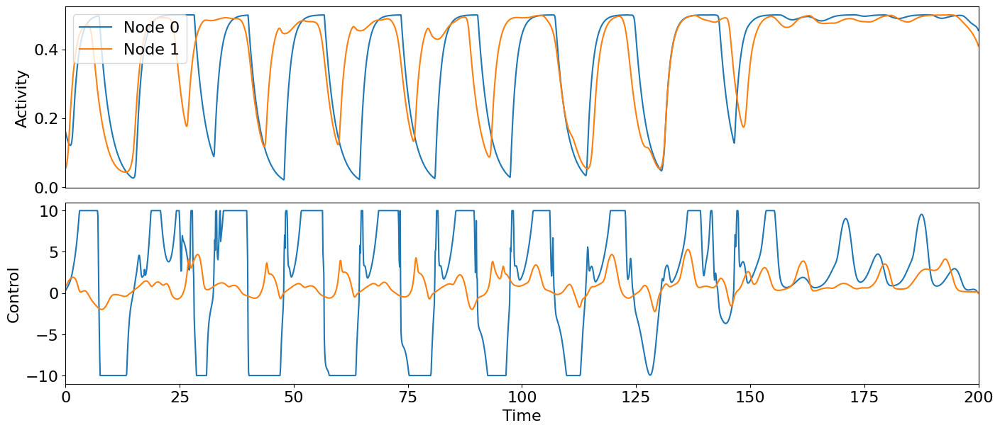

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5805983046817149
Converged in iteration 2 with cost 0.5774330290850648
Final cost : 0.5774330290850648


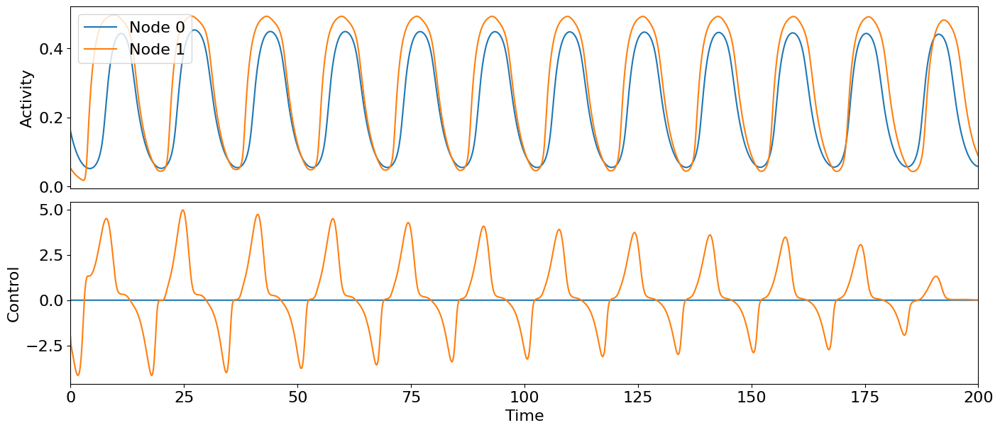

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.22657264770405908
Converged in iteration 2 with cost 0.224132927292056
Final cost : 0.224132927292056


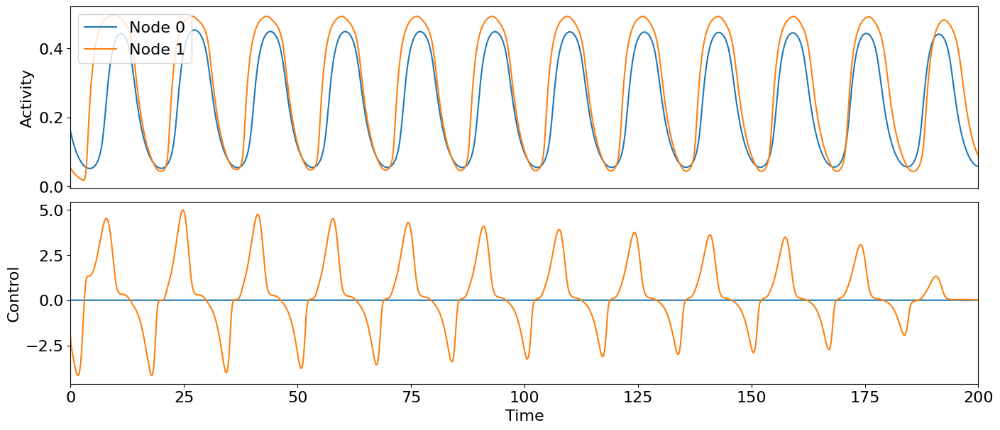

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.638608412044164
Converged in iteration 2 with cost -0.6418574769916937
Final cost : -0.6418574769916937


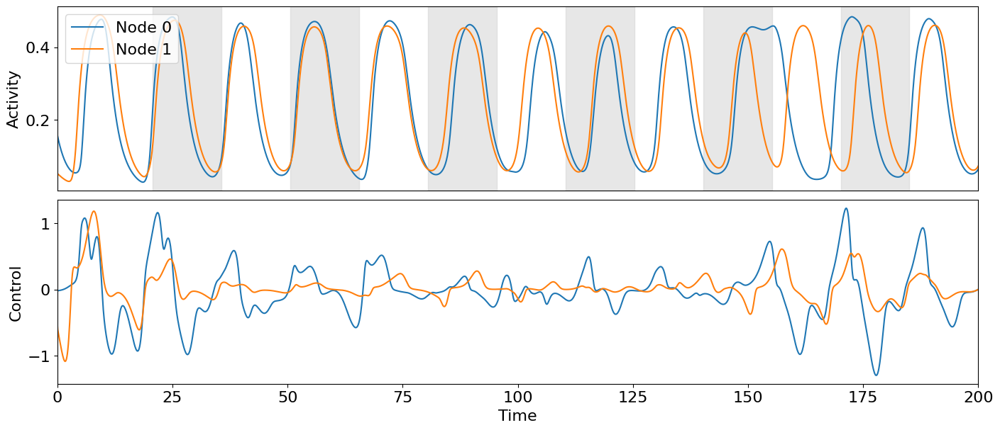

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8375976771578717
Cost in iteration 10: -0.8376475416654865
Converged in iteration 14 with cost -0.8377561583746069
Final cost : -0.8377561583746069


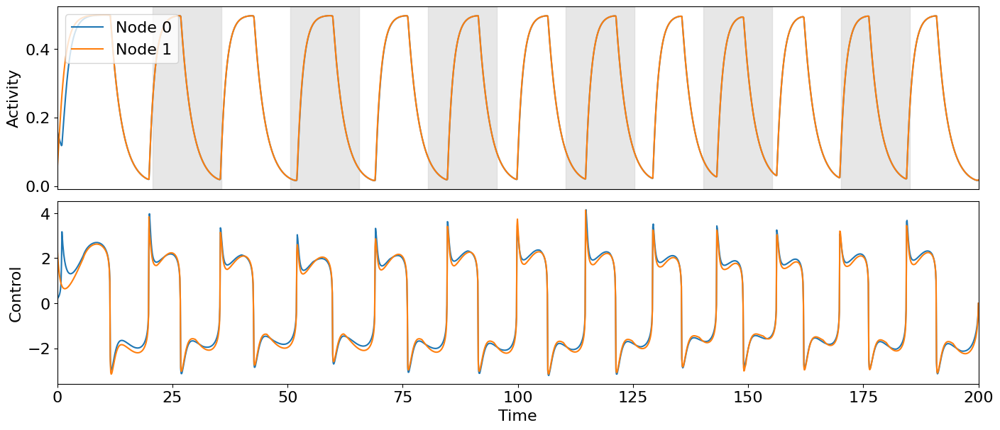

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.4602758572653007
Converged in iteration 2 with cost -2.4602758572653007
Final cost : -2.4602758572653007


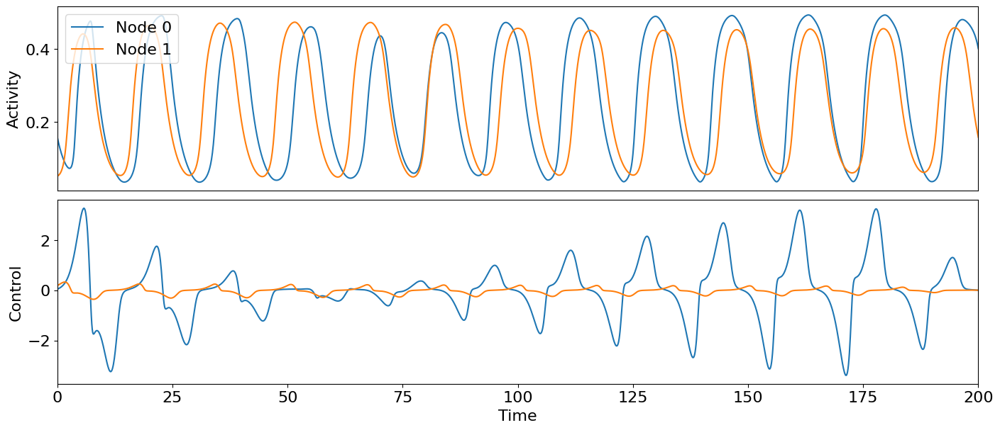

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.600135392599415
Converged in iteration 2 with cost -2.600135392599415
Final cost : -2.600135392599415


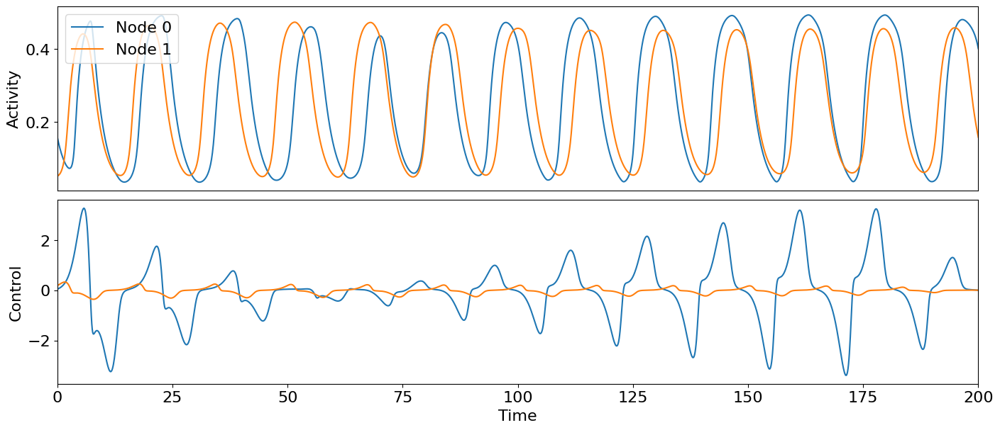

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -744.3113940965922
Converged in iteration 2 with cost -749.6693044691855
Final cost : -749.6693044691855


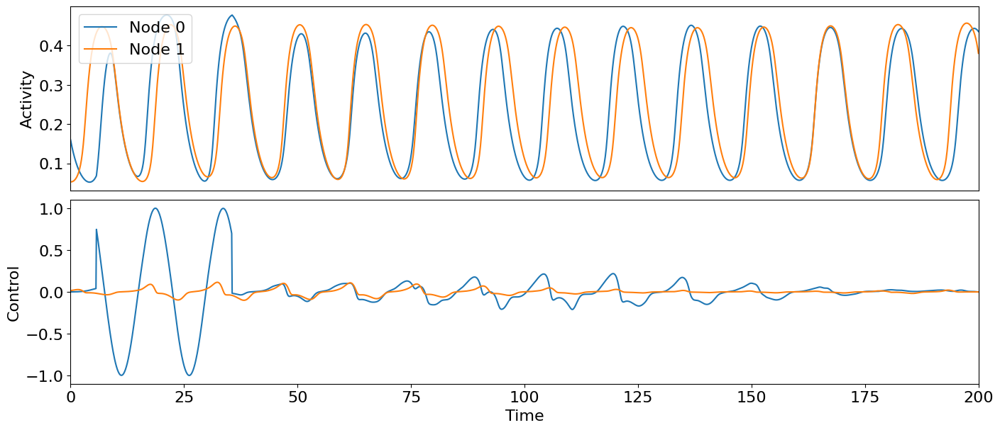

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -744.3279078337027
Converged in iteration 2 with cost -749.6862408417074
Final cost : -749.6862408417074


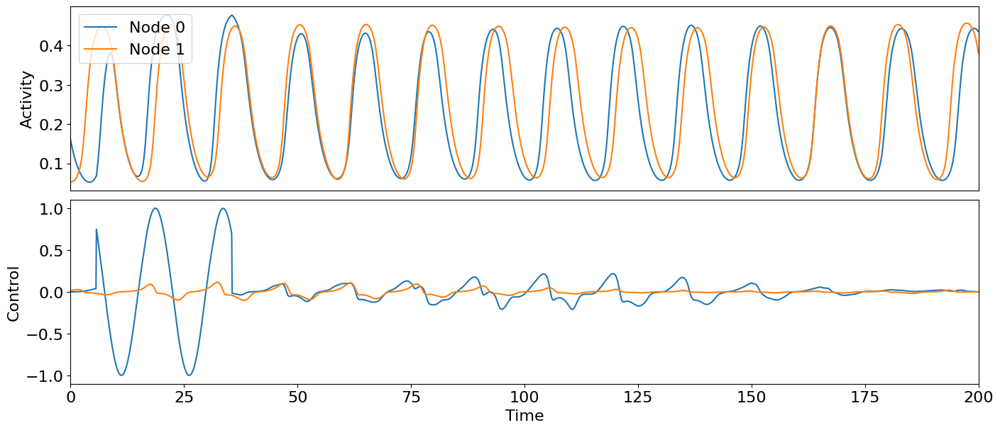

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.6757552244429026
Converged in iteration 2 with cost 0.6714596780063216
Final cost : 0.6714596780063216


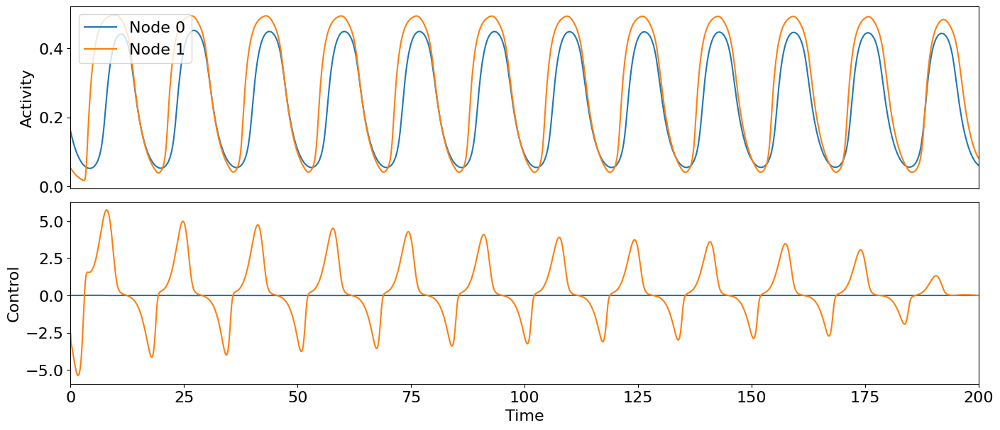

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.2935768994638245
Converged in iteration 2 with cost 0.28952541169852175
Final cost : 0.28952541169852175


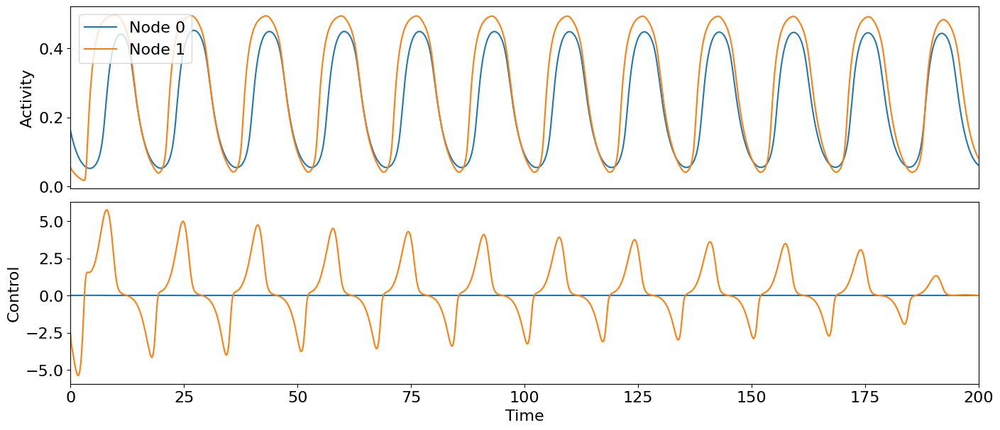

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.7784293280941837
Converged in iteration 7 with cost -0.7786219207494137
Final cost : -0.7786219207494137


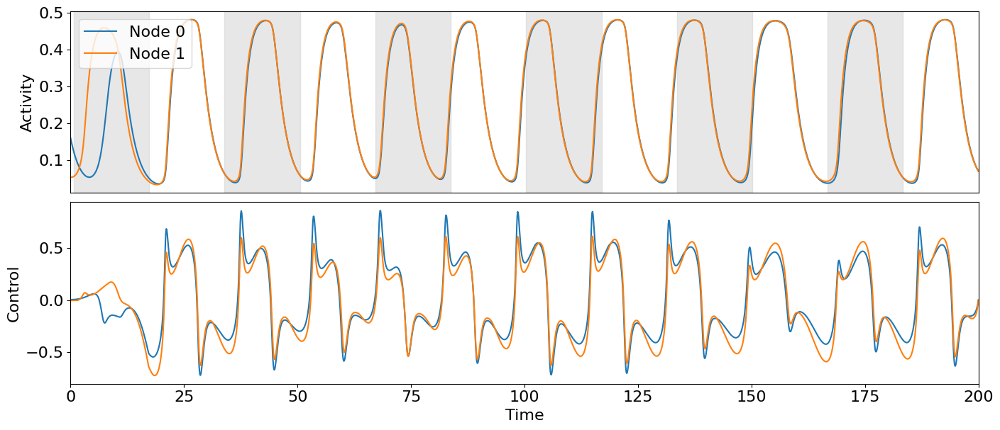

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8655401770000795
Converged in iteration 10 with cost -0.8655699294581453
Final cost : -0.8655699294581453


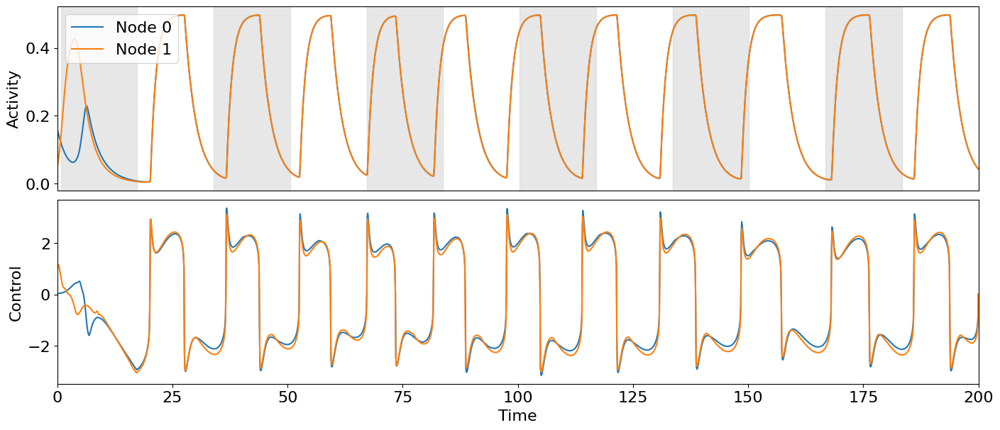

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.255317737511224
Converged in iteration 2 with cost -2.255317737511224
Final cost : -2.255317737511224


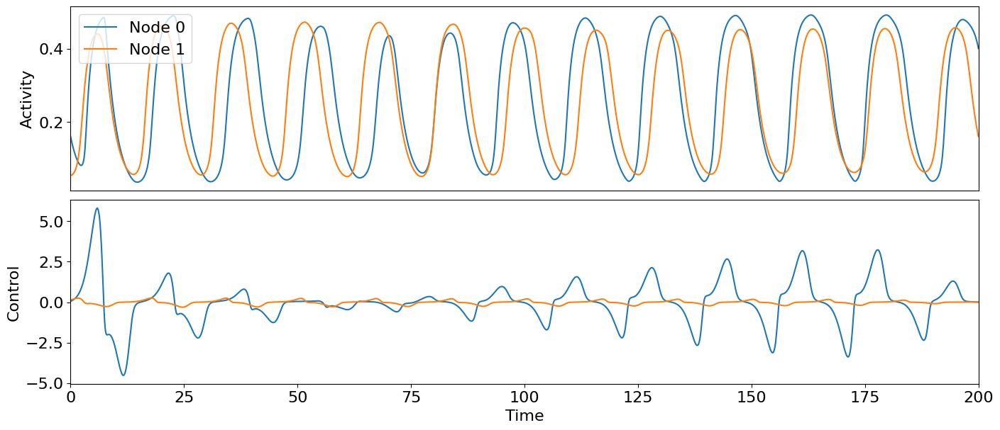

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.4330338047911106
Converged in iteration 2 with cost -2.4330338047911106
Final cost : -2.4330338047911106


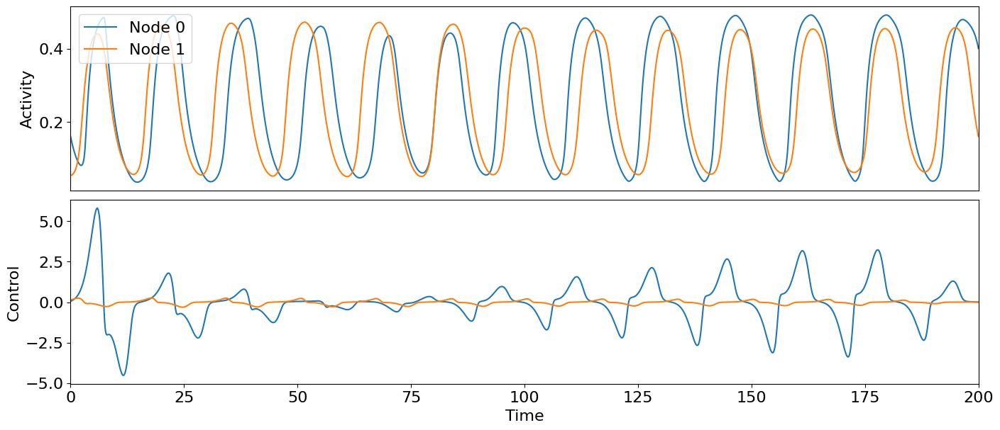

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -684.991776487474
Converged in iteration 2 with cost -697.2060297997689
Final cost : -697.2060297997689


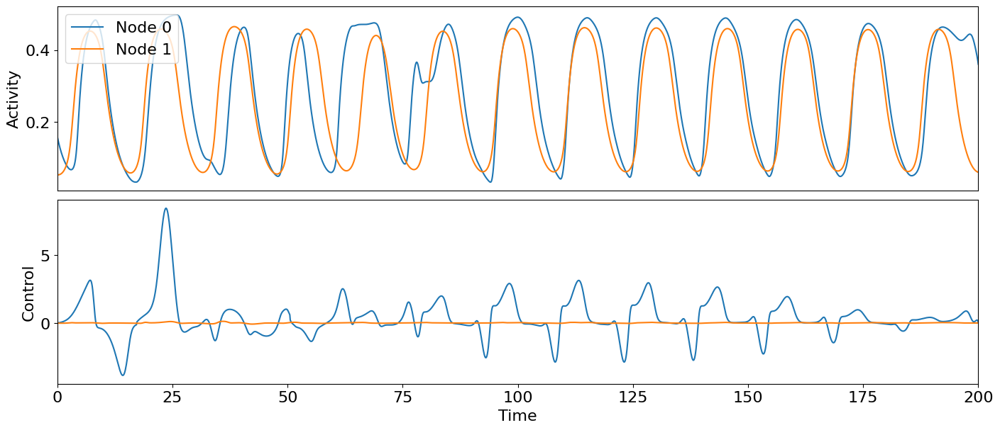

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -684.9963243519675
Converged in iteration 2 with cost -697.3523135941372
Final cost : -697.3523135941372


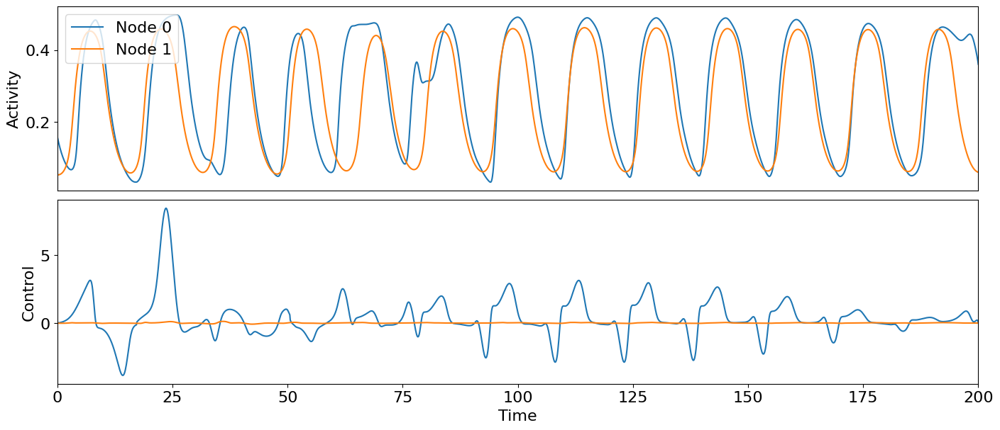

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5805983046817149
Converged in iteration 2 with cost 0.5774330290850648
Final cost : 0.5774330290850648


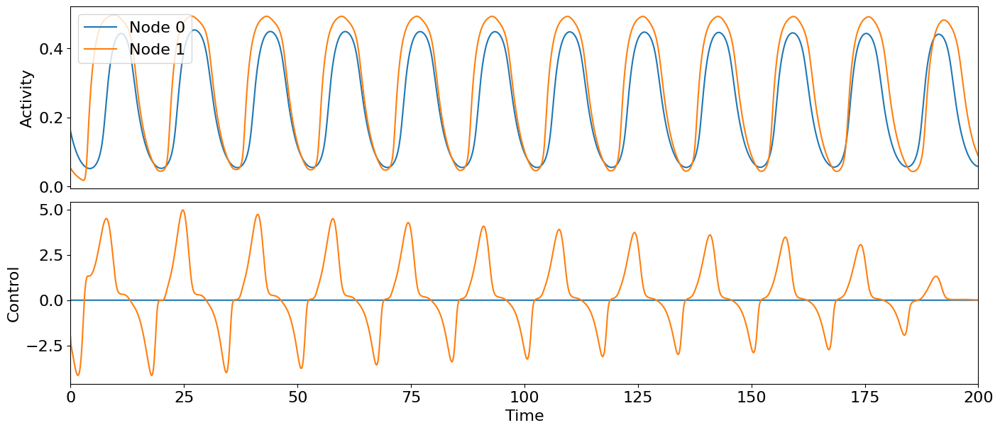

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.22657264770405908
Converged in iteration 2 with cost 0.224132927292056
Final cost : 0.224132927292056


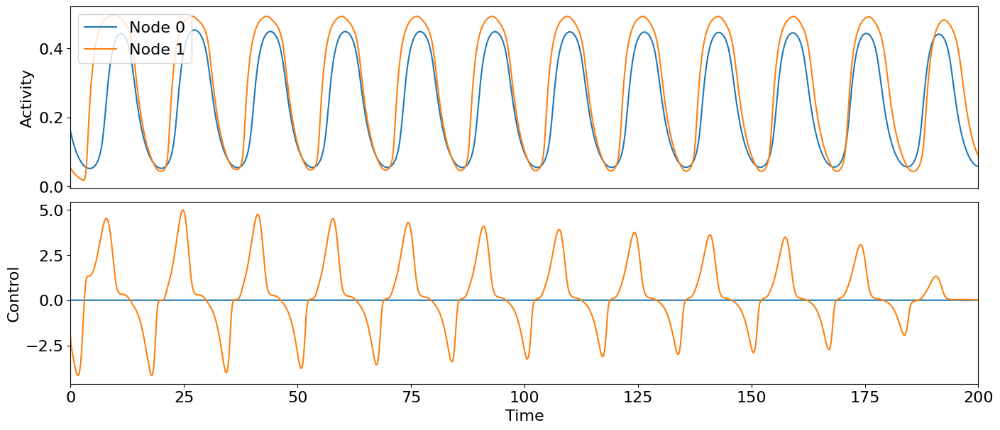

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5156501538437147
Converged in iteration 6 with cost -0.5318688871563596
Final cost : -0.5318688871563596


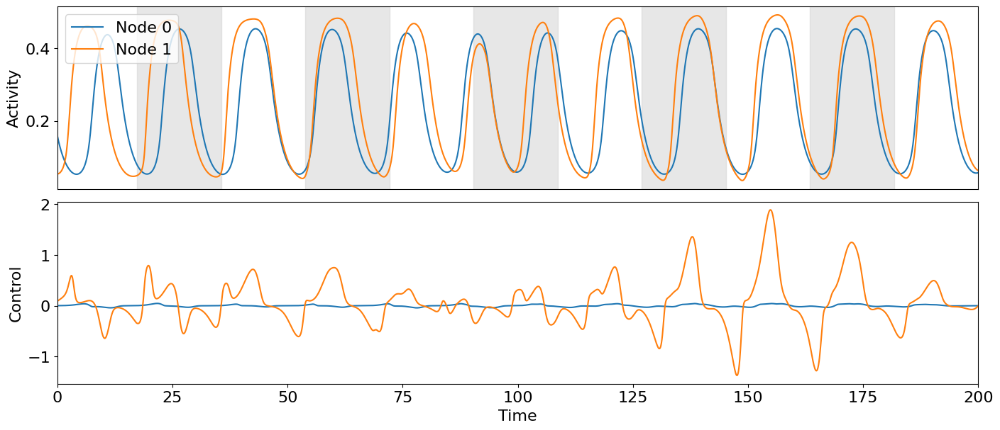

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5385379790149389
Converged in iteration 2 with cost -0.5426315586533453
Final cost : -0.5426315586533453


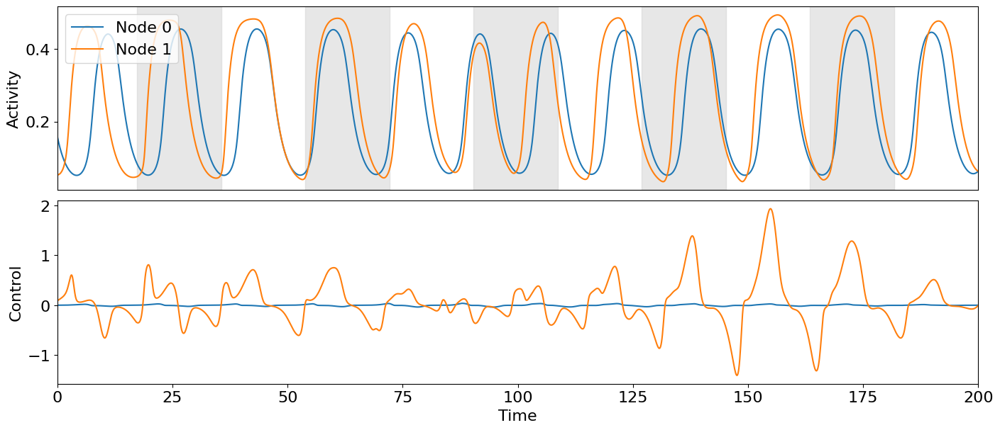

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.255317737511224
Converged in iteration 2 with cost -2.255317737511224
Final cost : -2.255317737511224


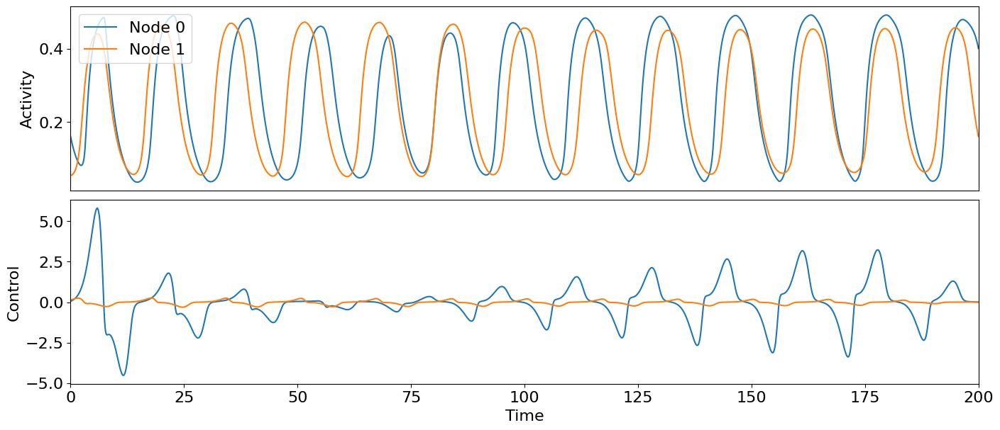

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.4330338047911106
Converged in iteration 2 with cost -2.4330338047911106
Final cost : -2.4330338047911106


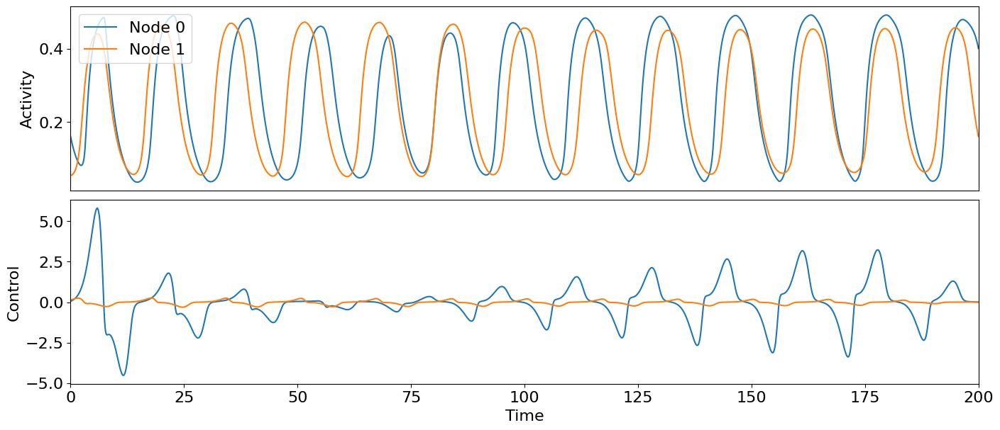

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -711.73316042438
Converged in iteration 2 with cost -711.7333585323963
Final cost : -711.7333585323963


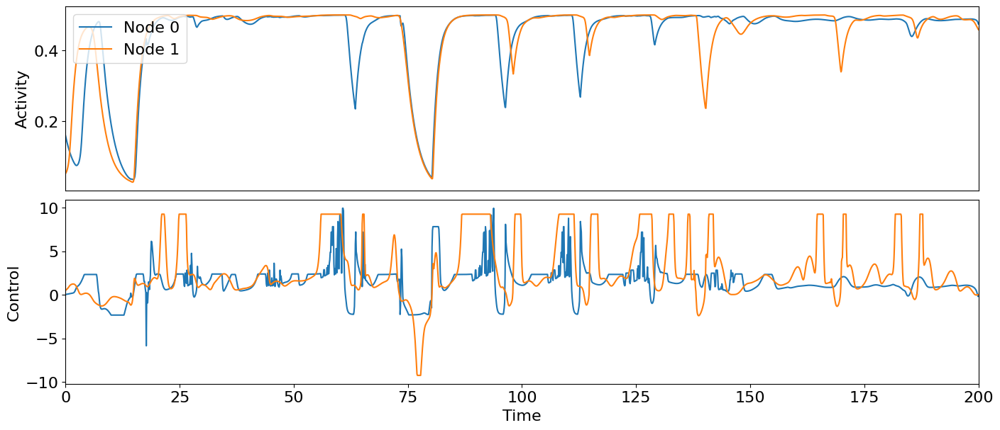

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -687.5835922110507
Converged in iteration 3 with cost -687.5835922110507
Final cost : -687.5835922110507


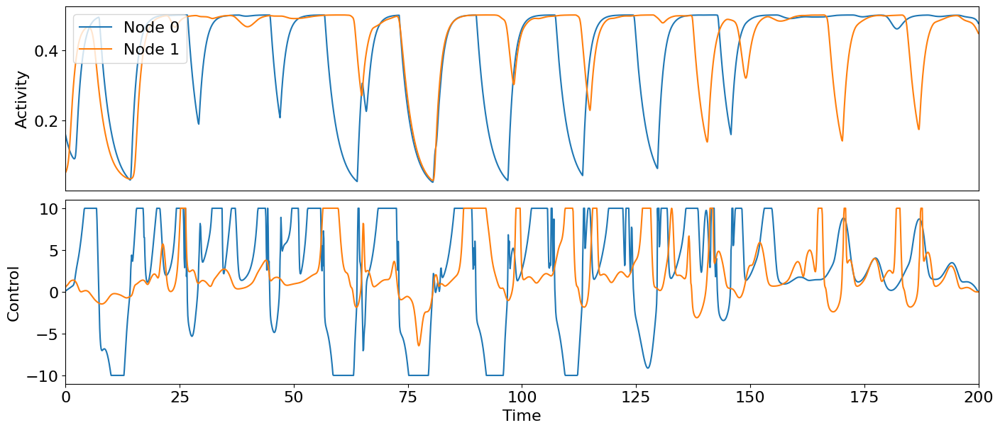

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5805983046817149
Converged in iteration 2 with cost 0.5774330290850648
Final cost : 0.5774330290850648


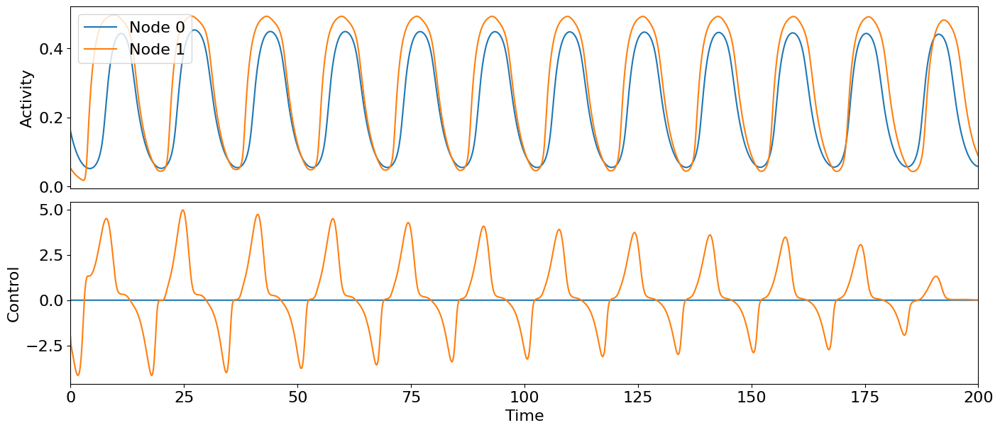

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.22657264770405908
Converged in iteration 2 with cost 0.224132927292056
Final cost : 0.224132927292056


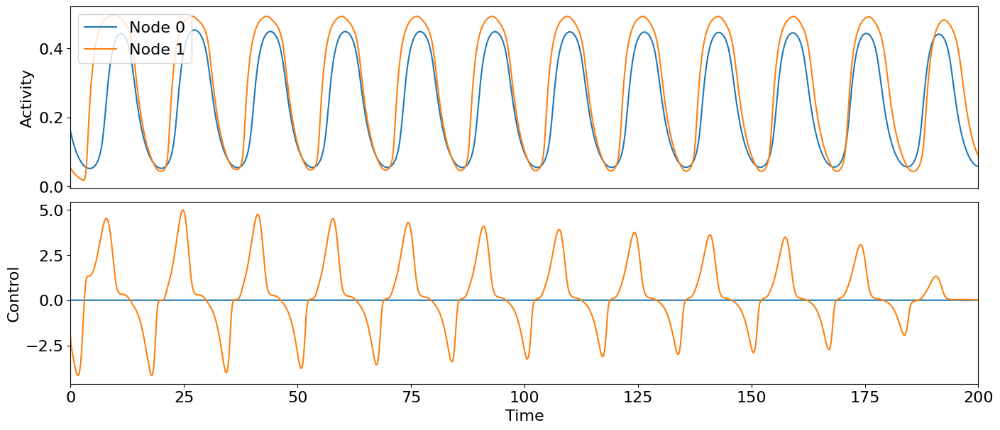

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.17857594368857976
Converged in iteration 3 with cost -0.23456254600283266
Final cost : -0.23456254600283266


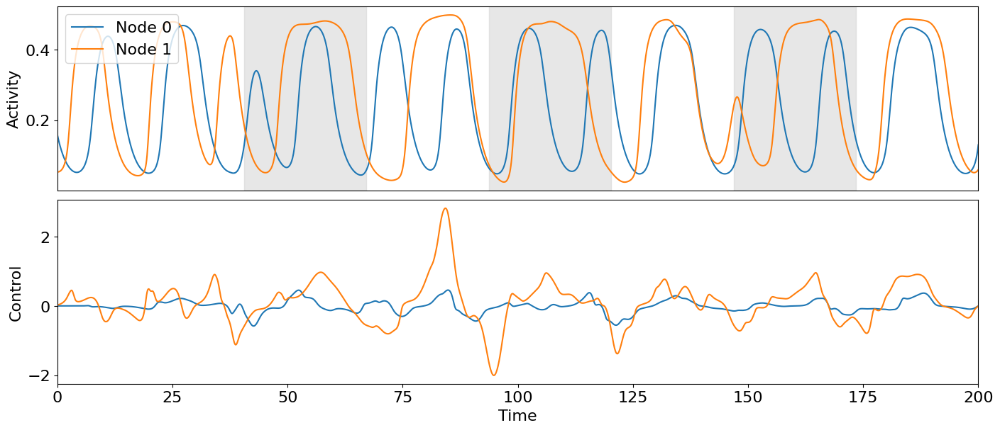

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5700382576176216
Cost in iteration 10: -0.570043522436721
Converged in iteration 12 with cost -0.5700443697032336
Final cost : -0.5700443697032336


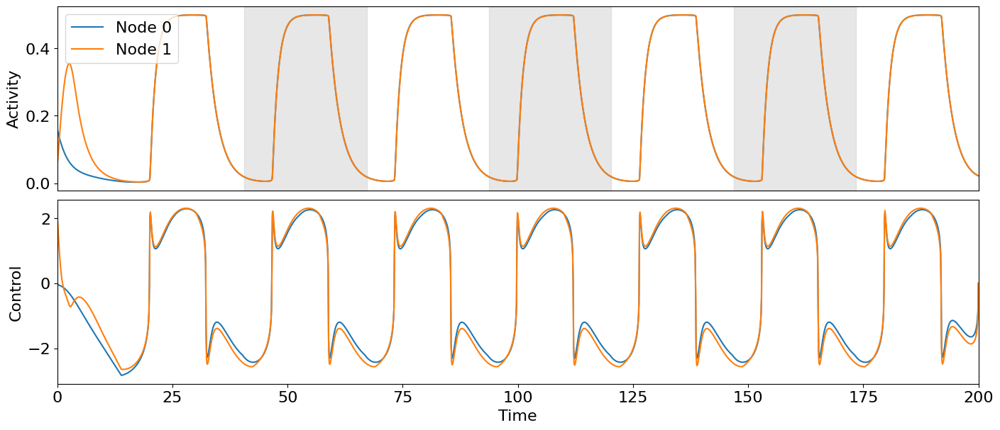

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.3414556958090973
Converged in iteration 2 with cost -2.3414556958090973
Final cost : -2.3414556958090973


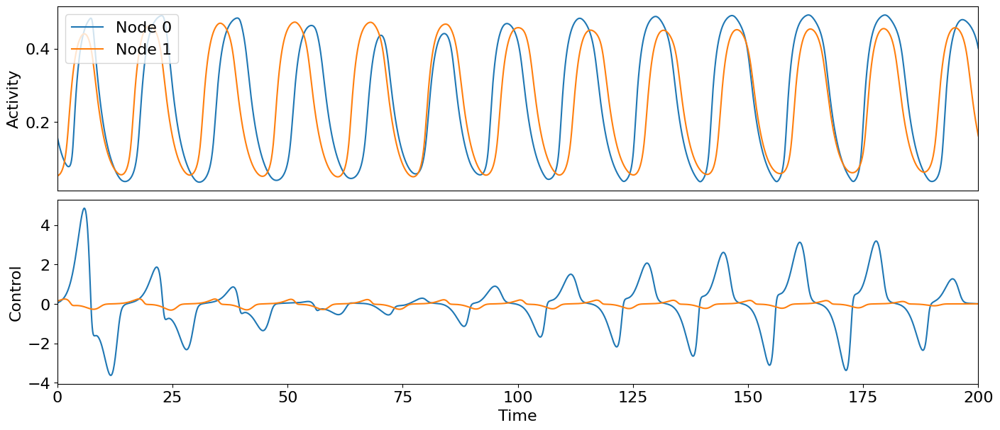

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.4963381077193185
Converged in iteration 2 with cost -2.4963381077193185
Final cost : -2.4963381077193185


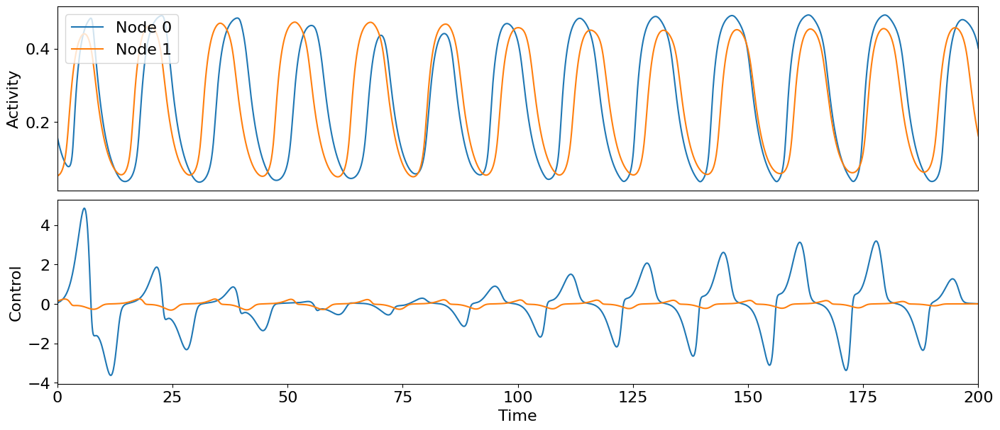

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -631.1791976031924
Converged in iteration 2 with cost -631.1791976031924
Final cost : -631.1791976031924


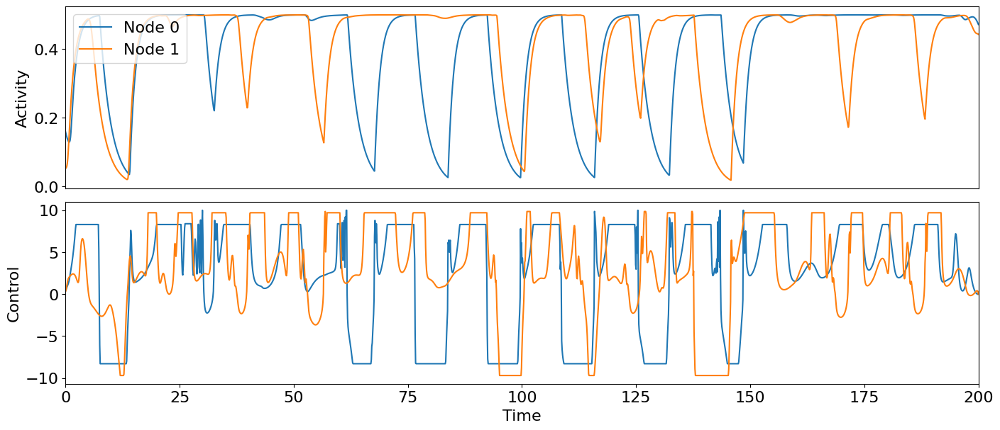

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -638.8076737481701
Converged in iteration 3 with cost -638.8076737481701
Final cost : -638.8076737481701


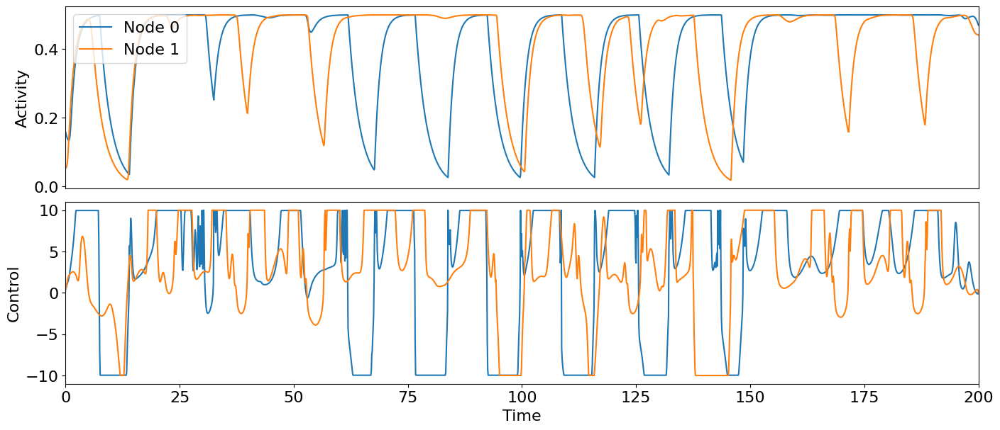

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5889831628014159
Converged in iteration 2 with cost 0.5734052551927831
Final cost : 0.5734052551927831


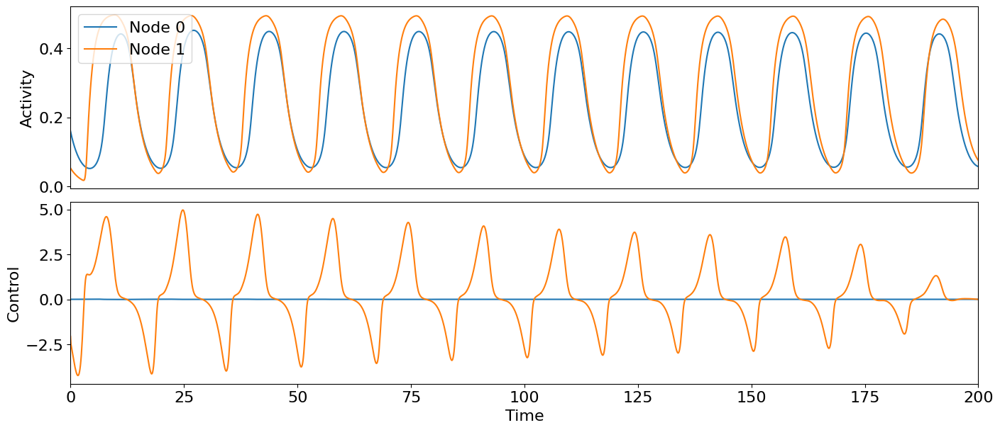

Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.2340553566611978
Converged in iteration 2 with cost 0.21854983725486707
Final cost : 0.21854983725486707


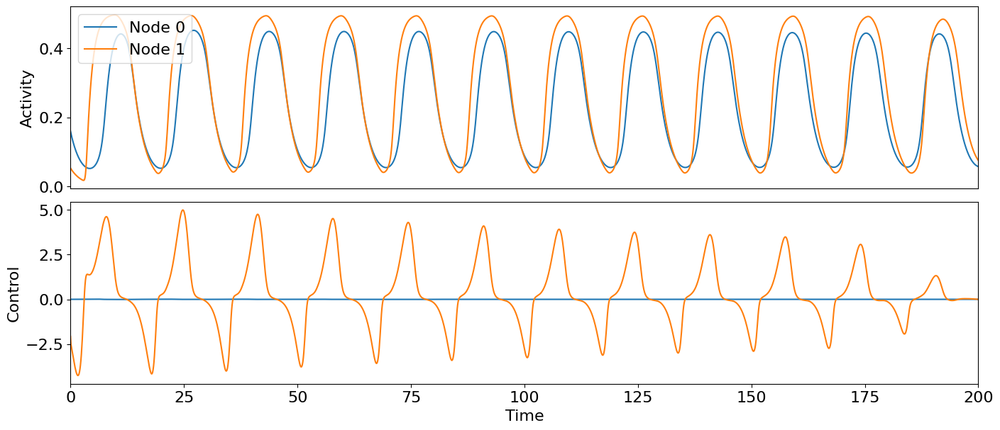

In [16]:
for pind in range(len(comp_points)):

    p = comp_points[pind]
    
    testd = 1000.
    model.params.duration = testd
    test_input = ZeroInput().generate_input(duration=testd+model.params.dt, dt=model.params.dt)
    model.params["exc_ext"] = test_input + p[0]
    model.params["inh_ext"] = test_input + p[1]
    model.run()

    einit = np.zeros((N, nmaxdel+1))
    iinit = np.zeros((N, nmaxdel+1))


    for n in range(N):
        einit[n,:] = model.exc[n,-1]
        iinit[n,:] = model.inh[n,-1]

    model.params.duration = duration

    model.params["exc_ext"] = zero_control[:,0,:] + p[0]
    model.params["inh_ext"] = zero_control[:,0,:] + p[1]

    model.params["exc_init"] = einit
    model.params["inh_init"] = iinit

    model.run()

    for itar in range(len(target_array)):

        target_period = target_array[itar]
        i00 = 0
        int0 = np.around( (duration - i00 * target_period) / model.params.dt, 0).astype(int)     
        while int0 > 200:
            i00 += 1
            int0 = np.around( (duration - i00 * target_period) / model.params.dt, 0).astype(int)

        for imet in range(4):

            for iw in range(len(w2_array)):
                
                w2 = w2_array[iw]

                model_controlled = oc_wc.OcWc(model, target_period, print_array=pr, cost_interval=(int0,None), cost_matrix=costmat, control_matrix = controlmat)
                model_controlled.maximum_control_strength = maxstr
                model_controlled.weights["w_p"] = 0.
                model_controlled.weights["w_2"] = w2

                if imet in [2]:
                    init_control = zero_control.copy()
                    tarray = np.arange(int0*dt, int0*dt + 2.*target_period, dt)
                    init_control[0,0,int0:int0+len(tarray)] = np.sin(2.*np.pi *tarray/target_period)
                    init_control[0,1,int0:int0+len(tarray)] = np.sin(2.*np.pi *tarray/target_period)

                    model_controlled.control = init_control.copy()
                    model_controlled.update_input()

                if imet == 0:
                    model_controlled.weights["w_f_sync"] = 1.
                elif imet == 1:
                    model_controlled.weights["w_cc"] = 1.
                elif imet == 2:
                    model_controlled.weights["w_ko"] = 1.
                elif imet == 3:
                    model_controlled.weights["w_var"] = 1.

                if type(results["controls"][pind][itar][imet][iw]) != type(None):
                    model_controlled.control = results["controls"][pind][itar][imet][iw].copy()
                    model_controlled.update_input()

                model_controlled.optimize(it)
                results["controls"][pind][itar][imet][iw] = model_controlled.control.copy()

                timings, periods = getperiods(model_controlled.get_xs(), proms[iw])
                results["timings"][pind][itar][imet][iw] = timings
                results["periods"][pind][itar][imet][iw] = periods

                fname = str(pind) + "_" + str(itar) + "_" + str(imet) + "_" + str(iw) + ".png"

                if imet == 0: plot_oc_nw(N, duration, dt, model_controlled.get_xs(), target_period, model_controlled.control, filename= os.path.join(dir, fname))
                else: plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

In [15]:
with open('snych_2n.pickle', 'wb') as f:
    pickle.dump(results, f)

In [8]:
with open('snych_2n.pickle', 'rb') as f:
    res_read = pickle.load(f)
    print(res_read.keys() )

results = res_read.copy()

dict_keys(['controls', 'periods', 'timings'])


In [11]:
xl = [ ["Down F", "Up F", "Osc F"], ["Down CC", "Up CC", "Osc CC"], ["Down KO", "Up KO", "Osc KO"], ["Down Var", "Up Var", "Osc Var"]]

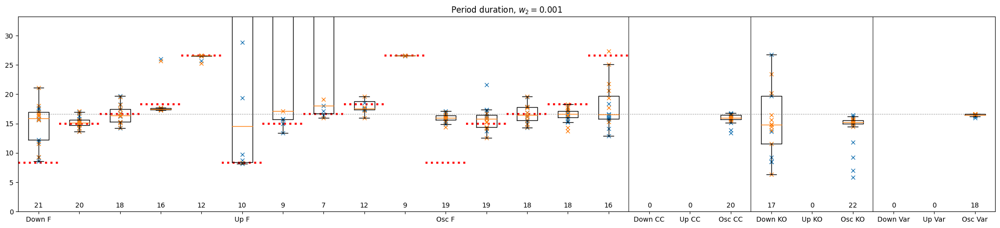

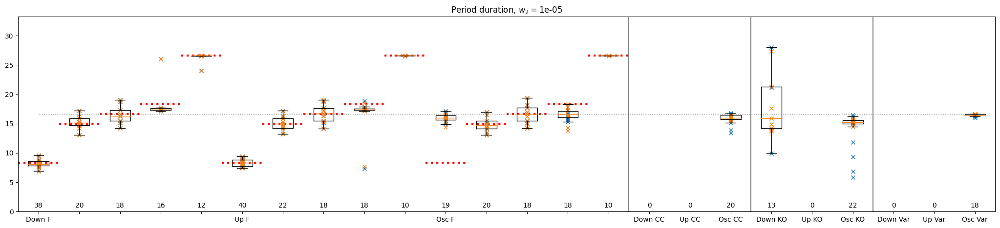

In [26]:
for iw in range(len(w2_array)):
    ydata = []
    xlabels = []
    fig = plt.figure(figsize =(20, 4))
    ax = fig.add_axes([0, 0, 1, 1])

    xpos = 0

    for imet in range(4):

        for pind in range(len(comp_points)):

            for itar in range(len(target_array)):

                if imet not in [0]:
                    if itar not in [2]:
                        continue

                target_period = target_array[itar]
                #xpos = 15*imet + 5*pind + itar 

                if imet in [0]:
                    if itar != 0:
                        xlabels.append("")
                    else:
                        xlabels.append(xl[imet][pind])
                else:
                    xlabels.append(xl[imet][pind])

                data = results["periods"][pind][itar][imet][iw]
                ydata_ = []
                
                if data is None:
                    ydata.append(ydata_)
                    continue

                n_datapoints = 0

                for n in range(N):
                    n_datapoints += len(data[n])
                    
                    if len(data[n]) != 0:
                        for dpoint in data[n]:
                            ax.plot(xpos+1, dpoint, marker="x", color=colors[n])
                            ydata_.append(dpoint)

                ydata.append(ydata_)

                ax.text(xpos+1, 1, str(n_datapoints), horizontalalignment='center', verticalalignment='center')
                if xpos < 15: ax.hlines(target_period, xpos+0.5, xpos+1.5, linestyle=":", color="red", linewidth =3)

                xpos += 1


    ax.boxplot(ydata, showfliers=False)
    ax.plot()
    ax.vlines([15.5, 18.5, 21.5], 0., 2.*period, color="grey")
    ax.hlines(period, 1., len(xlabels), linestyle=":", color="grey",linewidth = 1)
    ax.set_xticklabels(xlabels)
    ax.set_ylim(0., 2.*period)
    ax.set_title(r"Period duration, $w_2 = $" + "{}".format(w2_array[iw]))
    plt.show()
    fig.savefig(os.path.join(dir, "periods_" + str(iw) + ".png"), bbox_inches='tight')

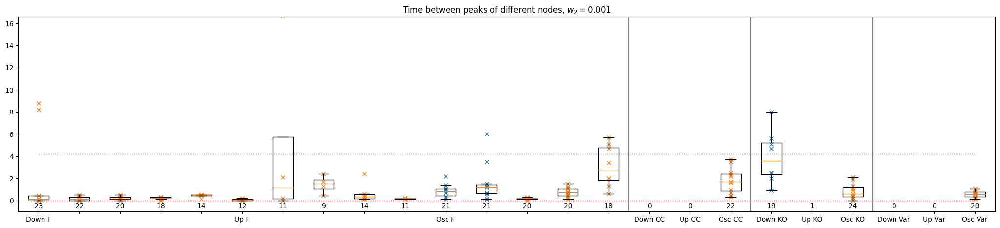

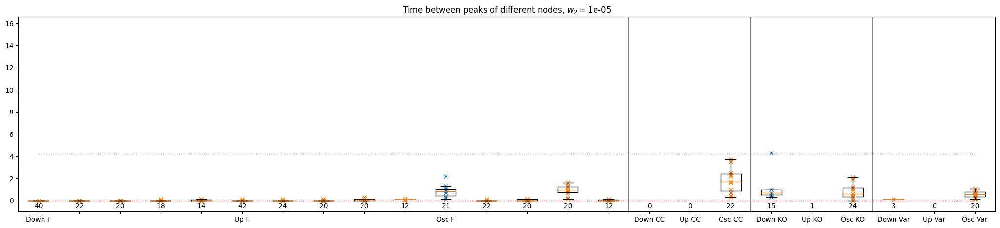

In [25]:
for iw in range(len(w2_array)):
    ydata = []
    xlabels = []
    fig = plt.figure(figsize =(20, 4))
    ax = fig.add_axes([0, 0, 1, 1])
    xpos = 0

    for imet in range(4):

        for pind in range(len(comp_points)):

            for itar in range(len(target_array)):

                if imet not in [0]:
                    if itar not in [2]:
                        continue

                if imet in [0]:
                    if itar != 0:
                        xlabels.append("")
                    else:
                        xlabels.append(xl[imet][pind])
                else:
                    xlabels.append(xl[imet][pind])

                data = results["timings"][pind][itar][imet][iw]
                ydata_ = []

                if data is None:
                    ydata.append(ydata_)
                    continue

                n_maxpeaks = 0

                for n in range(1, N):
                    if len(data[n]) > len(data[n_maxpeaks]):
                        n_maxpeaks = n

                n_datapoints = 0

                for n in range(N):
                    n_datapoints += len(data[n])
                    if n == n_maxpeaks:
                        continue
                    for p in data[n]:
                        dpoint = np.amin(np.abs(p - data[n_maxpeaks])) * dt
                        ydata_.append( dpoint )
                        ax.plot(xpos+1, dpoint, marker="x", color=colors[n])
                ax.text(xpos+1, -0.5, str(n_datapoints), horizontalalignment='center', verticalalignment='center')

                ydata.append(ydata_)

                xpos += 1

    ax.boxplot(ydata, showfliers=False)
    ax.plot()
    ax.hlines(0., 1., len(xlabels), linestyle=":", color="red",linewidth = 1)
    ax.hlines(nat_diff, 1., len(xlabels), linestyle=":", color="grey",linewidth = 1)
    ax.vlines([15.5, 18.5, 21.5], -1.,period, color="grey")
    ax.set_xticklabels(xlabels)
    ax.set_ylim(-1., period)
    ax.set_title(r"Time between peaks of different nodes, $w_2 = $" + "{}".format(w2_array[iw]))
    plt.show()
    fig.savefig(os.path.join(dir, "timings_" + str(iw) + ".png"), bbox_inches='tight')